# MIE 1624: Assignment 1 - Salary Classification

# Student Number - 1006376217

# -------------------------------------Contents ----------------------------------------------------

# 1. Data Cleaning

# 2. Exploratory Data Analysis

# 3. Feature Selection and Feature Importance

# 4. Model Implementation

# 5. Hyperparameter Tuning and Cross Validation

# 6. Testing

# 7. Discussion

# ---------Importing necessary libraries-------------

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelBinarizer,label_binarize
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer, confusion_matrix
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,cross_val_score,KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import r2_score,classification_report,accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import mutual_info_classif

# ---------------Importing the dataset-----------------------

In [3]:
#Importing the required dataset 
kaggle_df = pd.read_csv('Kaggle_Salary.csv', low_memory = False)

In [4]:
#Checking the shape of the imported dataframe
kaggle_df.shape

(12497, 248)

# ----Displaying the rows and columns of the dataset to a maximum display----

In [5]:
#Displaying the dataframe 
pd.options.display.max_rows = 50
pd.set_option('display.max_columns', None)
kaggle_df

,Time from Start to Finish (seconds),Q1,Q2,Q2_OTHER_TEXT,Q3,Q4,Q5,Q5_OTHER_TEXT,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_OTHER_TEXT,Q10,Q11,Q12_Part_1,Q12_Part_2,Q12_Part_3,Q12_Part_4,Q12_Part_5,Q12_Part_6,Q12_Part_7,Q12_Part_8,Q12_Part_9,Q12_Part_10,Q12_Part_11,Q12_Part_12,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q13_OTHER_TEXT,Q14,Q14_Part_1_TEXT,Q14_Part_2_TEXT,Q14_Part_3_TEXT,Q14_Part_4_TEXT,Q14_Part_5_TEXT,Q14_OTHER_TEXT,Q15,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q16_OTHER_TEXT,Q17_Part_1,Q17_Part_2,Q17_Part_3,Q17_Part_4,Q17_Part_5,Q17_Part_6,Q17_Part_7,Q17_Part_8,Q17_Part_9,Q17_Part_10,Q17_Part_11,Q17_Part_12,Q17_OTHER_TEXT,Q18_Part_1,Q18_Part_2,Q18_Part_3,Q18_Part_4,Q18_Part_5,Q18_Part_6,Q18_Part_7,Q18_Part_8,Q18_Part_9,Q18_Part_10,Q18_Part_11,Q18_Part_12,Q18_OTHER_TEXT,Q19,Q19_OTHER_TEXT,Q20_Part_1,Q20_Part_2,Q20_Part_3,Q20_Part_4,Q20_Part_5,Q20_Part_6,Q20_Part_7,Q20_Part_8,Q20_Part_9,Q20_Part_10,Q20_Part_11,Q20_Part_12,Q20_OTHER_TEXT,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q21_OTHER_TEXT,Q22,Q23,Q24_Part_1,Q24_Part_2,Q24_Part_3,Q24_Part_4,Q24_Part_5,Q24_Part_6,Q24_Part_7,Q24_Part_8,Q24_Part_9,Q24_Part_10,Q24_Part_11,Q24_Part_12,Q24_OTHER_TEXT,Q25_Part_1,Q25_Part_2,Q25_Part_3,Q25_Part_4,Q25_Part_5,Q25_Part_6,Q25_Part_7,Q25_Part_8,Q25_OTHER_TEXT,Q26_Part_1,Q26_Part_2,Q26_Part_3,Q26_Part_4,Q26_Part_5,Q26_Part_6,Q26_Part_7,Q26_OTHER_TEXT,Q27_Part_1,Q27_Part_2,Q27_Part_3,Q27_Part_4,Q27_Part_5,Q27_Part_6,Q27_OTHER_TEXT,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q28_OTHER_TEXT,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q29_OTHER_TEXT,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q30_OTHER_TEXT,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q31_OTHER_TEXT,Q32_Part_1,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q32_OTHER_TEXT,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q34_OTHER_TEXT,Q10_Encoded,Q10_buckets
0,510,22-24,Male,-1,France,Master’s degree,Software Engineer,-1,"1000-9,999 employees",0,I do not know,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,"30,000-39,999",$0 (USD),Twitter (data science influencers),NaN,NaN,"Kaggle (forums, blog, social media, etc)",NaN,NaN,NaN,"Blogs (Towards Data Science, Medium, Analytics...",Journal Publications (traditional publications...,NaN,NaN,NaN,-1,NaN,Coursera,NaN,DataCamp,NaN,Kaggle Courses (i.e. Kaggle Learn),NaN,Udemy,NaN,NaN,NaN,NaN,-1,"Basic statistical software (Microsoft Excel, G...",0,-1,-1,-1,-1,-1,1-2 years,"Jupyter (JupyterLab, Jupyter Notebooks, etc)",RStudio,PyCharm,NaN,MATLAB,NaN,Spyder,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,-1,Python,R,SQL,NaN,NaN,Java,Javascript,NaN,NaN,MATLAB,NaN,NaN,-1,Python,-1,NaN,Matplotlib,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,CPUs,GPUs,NaN,NaN,NaN,-1,Never,1-2 years,Linear or Logistic Regression,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,N

# ---------------Questions present in the dataset----------------

# 1. Data Cleaning----------------------

Deleting unnecessary features in the dataset, which do not contribute in the analysis of the dataset.
They mainly include other_text columns which contain the free flowing text and as per the mentioned description on the kaggle website, they have been shuffled and we do not have any means (as in keys) to connect them ,hence we will drop them. The question "Time from start to finish" doesn't play any significance in our analysis, hence can be dropped too. 

In [6]:
# Deleting the Other text columns,Unnamed, Time from start to finish, index
kaggle_df.drop([ 'Time from Start to Finish (seconds)', 'Q2_OTHER_TEXT', 'Q5_OTHER_TEXT', 'Q9_OTHER_TEXT','Q12_Part_1','Q12_Part_2','Q12_Part_3','Q12_Part_4','Q12_Part_5','Q12_Part_6','Q12_Part_7','Q12_Part_8','Q12_Part_9','Q12_Part_10','Q12_Part_11','Q12_Part_12', 'Q12_OTHER_TEXT','Q13_OTHER_TEXT',
         'Q14_OTHER_TEXT', 'Q16_OTHER_TEXT','Q17_OTHER_TEXT','Q18_OTHER_TEXT','Q19', 'Q19_OTHER_TEXT', 'Q20_OTHER_TEXT', 'Q21_OTHER_TEXT', 'Q24_OTHER_TEXT', 
         'Q25_OTHER_TEXT', 'Q26_OTHER_TEXT', 'Q27_OTHER_TEXT', 'Q28_OTHER_TEXT', 'Q29_OTHER_TEXT', 'Q30_OTHER_TEXT', 'Q31_OTHER_TEXT', 
         'Q32_OTHER_TEXT', 'Q33_OTHER_TEXT', 'Q34_OTHER_TEXT','Q10'], axis = 1, inplace = True)

Further, dropping the irrelevant columns manually.

**Q12** - Dropping Q12 because I feel it is irrelevant to contribute to the analysis of salary classification, which is our objective.


**Q19** - Dropping Q19 because I feel it is irrelevant to contribute to the analysis of salary classification as the popular media sources reporting data science topic column does not contribute in any way to our salary classification analysis, which is our objective.

In [7]:
#Checking whether the columns have been dropped off
kaggle_df

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q11,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q14,Q14_Part_1_TEXT,Q14_Part_2_TEXT,Q14_Part_3_TEXT,Q14_Part_4_TEXT,Q14_Part_5_TEXT,Q15,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q17_Part_1,Q17_Part_2,Q17_Part_3,Q17_Part_4,Q17_Part_5,Q17_Part_6,Q17_Part_7,Q17_Part_8,Q17_Part_9,Q17_Part_10,Q17_Part_11,Q17_Part_12,Q18_Part_1,Q18_Part_2,Q18_Part_3,Q18_Part_4,Q18_Part_5,Q18_Part_6,Q18_Part_7,Q18_Part_8,Q18_Part_9,Q18_Part_10,Q18_Part_11,Q18_Part_12,Q20_Part_1,Q20_Part_2,Q20_Part_3,Q20_Part_4,Q20_Part_5,Q20_Part_6,Q20_Part_7,Q20_Part_8,Q20_Part_9,Q20_Part_10,Q20_Part_11,Q20_Part_12,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q22,Q23,Q24_Part_1,Q24_Part_2,Q24_Part_3,Q24_Part_4,Q24_Part_5,Q24_Part_6,Q24_Part_7,Q24_Part_8,Q24_Part_9,Q24_Part_10,Q24_Part_11,Q24_Part_12,Q25_Part_1,Q25_Part_2,Q25_Part_3,Q25_Part_4,Q25_Part_5,Q25_Part_6,Q25_Part_7,Q25_Part_8,Q26_Part_1,Q26_Part_2,Q26_Part_3,Q26_Part_4,Q26_Part_5,Q26_Part_6,Q26_Part_7,Q27_Part_1,Q27_Part_2,Q27_Part_3,Q27_Part_4,Q27_Part_5,Q27_Part_6,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q32_Part_1,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q10_Encoded,Q10_buckets
0,22-24,Male,France,Master’s degree,Software Engineer,"1000-9,999 employees",0,I do not know,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,$0 (USD),NaN,Coursera,NaN,DataCamp,NaN,Kaggle Courses (i.e. Kaggle Learn),NaN,Udemy,NaN,NaN,NaN,NaN,"Basic statistical software (Microsoft Excel, G...",0,-1,-1,-1,-1,1-2 years,"Jupyter (JupyterLab, Jupyter Notebooks, etc)",RStudio,PyCharm,NaN,MATLAB,NaN,Spyder,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,Python,R,SQL,NaN,NaN,Java,Javascript,NaN,NaN,MATLAB,NaN,NaN,NaN,Matplotlib,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CPUs,GPUs,NaN,NaN,NaN,Never,1-2 years,Linear or Logistic Regression,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,"30,000-39,999"
1,40-44,Male,India,Professional degree,Software Engineer,"> 10,000 employees",20+,"We have well established ML methods (i.e., mod...",Analyze and understand data to influence produ...,Build and/or run the data infrastructure that ...,Build prototypes to explore applying machine l...,Build and/or run a machine learning service th...,NaN,NaN,NaN,NaN,"> $100,000 ($USD)",NaN,Coursera,NaN,DataCamp,NaN,Kaggle Courses (i.e. Kaggle Learn),NaN,Udemy,NaN,NaN,NaN,NaN,"Cloud-based data software & APIs (AWS, GCP, Az...",-1,-1,-1,-1,0,I have never written code,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

Many columns contain a lot of null values. This could possibly be the result of the respondents not answering all the questions on the survey. Other possible reason could be that the next questions could not be applicable to them , for example if some person's educational qualification is only limited to high school, further questions become pointless.  

In [8]:
# Finding the null values for each column and sorting them in descending order
s= kaggle_df.isnull().sum(axis=0) / kaggle_df.shape[0]
s = s.sort_values(ascending=False) 

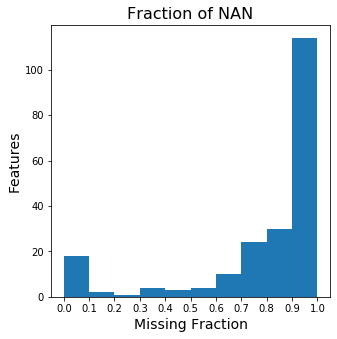

In [9]:
#Plotting to see how many columns have what fraction of null columns
plt.figure(figsize = (5, 5))
plt.hist(s, bins = np.linspace(0, 1, 11))
plt.xticks(np.linspace(0, 1, 11));
plt.xlabel('Missing Fraction', size = 14); plt.ylabel('Features', size = 14); 
plt.title("Fraction of NAN", size = 16);

It wouldn't be recommended to drop the columns based on the percentage of Nan values, and so to adress this problem, we will first join all the multiple choice options with the columns and then check for null values beyond a threshold. Let's keep the threshold to 50%.

In [10]:
# These are the questions with multiple choice
multiple  = ["Q9","Q13","Q16","Q15","Q16","Q17","Q18","Q20","Q21","Q24","Q25","Q26","Q27","Q28","Q29","Q30","Q31","Q32","Q33","Q34"]

The approach being used here is to make a copy of the dataframe, join all the multiple choice questions and then find the null value ratio, and eliminate the columns 

In [11]:
# we create a copy of our dataframe so as to avoid messing up wit the original dataframe
test = kaggle_df.copy()

# for every question with multiple choice we run a loop
for i in multiple:
    #find all the columns which start with the question number
    filter_col = [col for col in test if col.startswith(i)]
    #we fill all NAN with blanks. As it is not possible to compare cells with Null.
    test[filter_col] = test[filter_col].fillna('')
    # we convert the columns to string 
    test[filter_col] = test[filter_col].astype(str)
    # Joining all columns for the same question
    test[i] = test[filter_col].apply(lambda x: ''.join(x), axis=1)
    #dropping the individual columns 
    test.drop(filter_col, axis = 1, inplace = True)
    

In [12]:
# replacing the blanks with NAN
test = test.replace(r'^\s*$', np.nan, regex=True)

In [13]:
# Again finding the null values in our new dataframe for each column and sorting them in descending order
s= test.isnull().sum(axis=0) / kaggle_df.shape[0]
s = s.sort_values(ascending=False) 

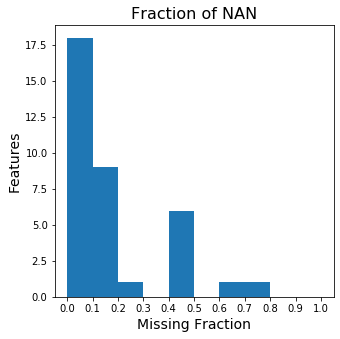

In [14]:
#Plotting to see how many columns have what fraction of null columns
plt.figure(figsize = (5, 5))
plt.hist(s, bins = np.linspace(0, 1, 11))
plt.xticks(np.linspace(0, 1, 11));
plt.xlabel('Missing Fraction', size = 14); plt.ylabel('Features', size = 14); 
plt.title("Fraction of NAN", size = 16);

In [15]:
#Putting the threshold value of 50% Nan values and getting the columns having the same
s[s >.5]

Q27    0.776426
Q26    0.678323
dtype: float64

Dropping Q26 and Q27, along with all of its multiple choices because it overall contains more than 50% of null values, as demonstrated above and hence is not significant for our analysis.

In [16]:
#Finding the all the columns for Q26
filter_col = [col for col in kaggle_df if col.startswith('Q26')]
#Dropping Q26
kaggle_df.drop(filter_col, axis = 1, inplace = True)
#Finding the all the columns for Q27
filter_col1 = [col for col in kaggle_df if col.startswith('Q27')]
#Dropping Q27
kaggle_df.drop(filter_col1, axis = 1, inplace = True)

In [17]:
#Checking whether Q26 and Q27 are dropped
kaggle_df

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q11,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q14,Q14_Part_1_TEXT,Q14_Part_2_TEXT,Q14_Part_3_TEXT,Q14_Part_4_TEXT,Q14_Part_5_TEXT,Q15,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q17_Part_1,Q17_Part_2,Q17_Part_3,Q17_Part_4,Q17_Part_5,Q17_Part_6,Q17_Part_7,Q17_Part_8,Q17_Part_9,Q17_Part_10,Q17_Part_11,Q17_Part_12,Q18_Part_1,Q18_Part_2,Q18_Part_3,Q18_Part_4,Q18_Part_5,Q18_Part_6,Q18_Part_7,Q18_Part_8,Q18_Part_9,Q18_Part_10,Q18_Part_11,Q18_Part_12,Q20_Part_1,Q20_Part_2,Q20_Part_3,Q20_Part_4,Q20_Part_5,Q20_Part_6,Q20_Part_7,Q20_Part_8,Q20_Part_9,Q20_Part_10,Q20_Part_11,Q20_Part_12,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q22,Q23,Q24_Part_1,Q24_Part_2,Q24_Part_3,Q24_Part_4,Q24_Part_5,Q24_Part_6,Q24_Part_7,Q24_Part_8,Q24_Part_9,Q24_Part_10,Q24_Part_11,Q24_Part_12,Q25_Part_1,Q25_Part_2,Q25_Part_3,Q25_Part_4,Q25_Part_5,Q25_Part_6,Q25_Part_7,Q25_Part_8,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q32_Part_1,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q10_Encoded,Q10_buckets
0,22-24,Male,France,Master’s degree,Software Engineer,"1000-9,999 employees",0,I do not know,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,$0 (USD),NaN,Coursera,NaN,DataCamp,NaN,Kaggle Courses (i.e. Kaggle Learn),NaN,Udemy,NaN,NaN,NaN,NaN,"Basic statistical software (Microsoft Excel, G...",0,-1,-1,-1,-1,1-2 years,"Jupyter (JupyterLab, Jupyter Notebooks, etc)",RStudio,PyCharm,NaN,MATLAB,NaN,Spyder,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,Python,R,SQL,NaN,NaN,Java,Javascript,NaN,NaN,MATLAB,NaN,NaN,NaN,Matplotlib,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CPUs,GPUs,NaN,NaN,NaN,Never,1-2 years,Linear or Logistic Regression,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,"30,000-39,999"
1,40-44,Male,India,Professional degree,Software Engineer,"> 10,000 employees",20+,"We have well established ML methods (i.e., mod...",Analyze and understand data to influence produ...,Build and/or run the data infrastructure that ...,Build prototypes to explore applying machine l...,Build and/or run a machine learning service th...,NaN,NaN,NaN,NaN,"> $100,000 ($USD)",NaN,Coursera,NaN,DataCamp,NaN,Kaggle Courses (i.e. Kaggle Learn),NaN,Udemy,NaN,NaN,NaN,NaN,"Cloud-based data software & APIs (AWS, GCP, Az...",-1,-1,-1,-1,0,I have never written code,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [18]:
#Converting the salary range(Q10_buckets) to a specific number
kaggle_df['Q10_buckets'] = kaggle_df['Q10_buckets'].map({'$0-999': 1000, '1,000-1,999': 2000, '2,000-2,999': 3000, '3,000-3,999': 4000, '4,000-4,999': 5000, '5,000-7,499': 7500, '7,500-9,999': 10000, '10,000-14,999': 15000, '15,000-19,999': 20000, '20,000-24,999': 25000, '25,000-29,999': 30000, '30,000-39,999': 40000, '40,000-49,999': 50000, '50,000-59,999': 60000, '60,000-69,999': 70000,  '70,000-79,999': 80000, '80,000-89,999': 90000, '90,000-99,999': 100000, '100,000-124,999': 125000, '125,000-149,999': 150000, '150,000-199,999': 200000, '200,000-249,999': 250000, '250,000-299,999': 300000, '300,000-500,000': 400000, '> $500,000': 500000})

In [19]:
#Solving the Q14 abnormality
kaggle_df['Q14'] = kaggle_df['Q14'].astype(str)
kaggle_df['Q14'].unique()

array(['Basic statistical software (Microsoft Excel, Google Sheets, etc.)',
       'Cloud-based data software & APIs (AWS, GCP, Azure, etc.)',
       'Local development environments (RStudio, JupyterLab, etc.)',
       'Advanced statistical software (SPSS, SAS, etc.)', 'Other',
       'Business intelligence software (Salesforce, Tableau, Spotfire, etc.)',
       'nan'], dtype=object)

In [20]:
#One Hot Encoding the Q14 column
ohe_q14 = pd.get_dummies(kaggle_df.Q14)
ohe_q14

,"Advanced statistical software (SPSS, SAS, etc.)","Basic statistical software (Microsoft Excel, Google Sheets, etc.)","Business intelligence software (Salesforce, Tableau, Spotfire, etc.)","Cloud-based data software & APIs (AWS, GCP, Azure, etc.)","Local development environments (RStudio, JupyterLab, etc.)",Other,nan
0,0,1,0,0,0,0,0
1,0,0,0,1,0,0,0
2,0,0,0,0,1,0,0
3,0,0,0,0,1,0,0
4,1,0,0,0,0,0,0
5,0,0,0,0,1,0,0
6,0,0,0,0,1,0,0
7,0,0,0,0,1,0,0
8,0,1,0,0,0,0,0
9,0,0,0,0,1,0,0


In [21]:
#Renaming the column names for Q14
ohe_q14.columns = [
                   'Q14_Part_1_Advanced statistical software (SPSS, SAS, etc.)',
                   'Q14_Part_2_Basic statistical software (Microsoft Excel, Google Sheets, etc.)',
                   'Q14_Part_3_Business intelligence software (Salesforce, Tableau, Spotfire, etc.)',
                   'Q14_Part_4_Cloud-based data software & APIs (AWS, GCP, Azure, etc.)',
                   'Q14_Part_5_Local development environments (RStudio, JupyterLab, etc.)',
                   'Q14_Part_6_Other',
                   'Q14_Nan'
                  ]

In [22]:
#finding the location of Q14
q14_idx = kaggle_df.columns.get_loc('Q14')

In [23]:
q14_idx

29

In [24]:
#dropping the existing Q14 columns
q14_drop = [column for column in kaggle_df.columns if 'Q14' in column]
kaggle_df = kaggle_df.drop(q14_drop, axis =1)

In [25]:
#Inserting new Q_14 at the same index location
for j in range (0,6):
    kaggle_df.insert(loc=q14_idx, column = ohe_q14.columns[6-j], value = ohe_q14.iloc[:,6-j])

In [26]:
#Checking the dataframe after inserting Q_14
kaggle_df

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q11,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,"Q14_Part_2_Basic statistical software (Microsoft Excel, Google Sheets, etc.)","Q14_Part_3_Business intelligence software (Salesforce, Tableau, Spotfire, etc.)","Q14_Part_4_Cloud-based data software & APIs (AWS, GCP, Azure, etc.)","Q14_Part_5_Local development environments (RStudio, JupyterLab, etc.)",Q14_Part_6_Other,Q14_Nan,Q15,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q17_Part_1,Q17_Part_2,Q17_Part_3,Q17_Part_4,Q17_Part_5,Q17_Part_6,Q17_Part_7,Q17_Part_8,Q17_Part_9,Q17_Part_10,Q17_Part_11,Q17_Part_12,Q18_Part_1,Q18_Part_2,Q18_Part_3,Q18_Part_4,Q18_Part_5,Q18_Part_6,Q18_Part_7,Q18_Part_8,Q18_Part_9,Q18_Part_10,Q18_Part_11,Q18_Part_12,Q20_Part_1,Q20_Part_2,Q20_Part_3,Q20_Part_4,Q20_Part_5,Q20_Part_6,Q20_Part_7,Q20_Part_8,Q20_Part_9,Q20_Part_10,Q20_Part_11,Q20_Part_12,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q22,Q23,Q24_Part_1,Q24_Part_2,Q24_Part_3,Q24_Part_4,Q24_Part_5,Q24_Part_6,Q24_Part_7,Q24_Part_8,Q24_Part_9,Q24_Part_10,Q24_Part_11,Q24_Part_12,Q25_Part_1,Q25_Part_2,Q25_Part_3,Q25_Part_4,Q25_Part_5,Q25_Part_6,Q25_Part_7,Q25_Part_8,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q32_Part_1,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q10_Encoded,Q10_buckets
0,22-24,Male,France,Master’s degree,Software Engineer,"1000-9,999 employees",0,I do not know,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,$0 (USD),NaN,Coursera,NaN,DataCamp,NaN,Kaggle Courses (i.e. Kaggle Learn),NaN,Udemy,NaN,NaN,NaN,NaN,1,0,0,0,0,0,1-2 years,"Jupyter (JupyterLab, Jupyter Notebooks, etc)",RStudio,PyCharm,NaN,MATLAB,NaN,Spyder,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,Python,R,SQL,NaN,NaN,Java,Javascript,NaN,NaN,MATLAB,NaN,NaN,NaN,Matplotlib,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CPUs,GPUs,NaN,NaN,NaN,Never,1-2 years,Linear or Logistic Regression,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,40000.0
1,40-44,Male,India,Professional degree,Software Engineer,"> 10,000 employees",20+,"We have well established ML methods (i.e., mod...",Analyze and understand data to influence produ...,Build and/or run the data infrastructure that ...,Build prototypes to explore applying machine l...,Build and/or run a machine learning service th...,NaN,NaN,NaN,NaN,"> $100,000 ($USD)",NaN,Coursera,NaN,DataCamp,NaN,Kaggle Courses (i.e. Kaggle Learn),NaN,Udemy,NaN,NaN,NaN,NaN,0,0,1,0,0,0,I have never written code,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

Replace the Nan values in the dataset with mode (statistical method). This is an approximation which can add variance to the data set. But the loss of the data can be negated by this method which yields better results compared to removal of rows and columns.

In [27]:
#For filling Nan values in the dataframe with mode values
for column in kaggle_df.columns:
    kaggle_df['Q11'].fillna(kaggle_df['Q11'].mode()[0], inplace=True)
  

#For filling Nan values in the dataframe with mode values
for column in kaggle_df.columns:
    kaggle_df['Q15'].fillna(kaggle_df['Q15'].mode()[0], inplace=True)
    
    
#For filling Nan values in the dataframe with mode values
for column in kaggle_df.columns:
    kaggle_df['Q10_buckets'].fillna(kaggle_df['Q10_buckets'].mode()[0], inplace=True)

In [28]:
#One hot encoding the dataset
kaggle_df_with_dummies = pd.get_dummies(kaggle_df)

In [29]:
#One Hot encoded dataset
kaggle_df_with_dummies

,"Q14_Part_2_Basic statistical software (Microsoft Excel, Google Sheets, etc.)","Q14_Part_3_Business intelligence software (Salesforce, Tableau, Spotfire, etc.)","Q14_Part_4_Cloud-based data software & APIs (AWS, GCP, Azure, etc.)","Q14_Part_5_Local development environments (RStudio, JupyterLab, etc.)",Q14_Part_6_Other,Q14_Nan,Q10_Encoded,Q10_buckets,Q1_18-21,Q1_22-24,Q1_25-29,Q1_30-34,Q1_35-39,Q1_40-44,Q1_45-49,Q1_50-54,Q1_55-59,Q1_60-69,Q1_70+,Q2_Female,Q2_Male,Q2_Prefer not to say,Q2_Prefer to self-describe,Q3_Algeria,Q3_Argentina,Q3_Australia,Q3_Austria,Q3_Bangladesh,Q3_Belarus,Q3_Belgium,Q3_Brazil,Q3_Canada,Q3_Chile,Q3_China,Q3_Colombia,Q3_Czech Republic,Q3_Denmark,Q3_Egypt,Q3_France,Q3_Germany,Q3_Greece,Q3_Hong Kong (S.A.R.),Q3_Hungary,Q3_India,Q3_Indonesia,"Q3_Iran, Islamic Republic of...",Q3_Ireland,Q3_Israel,Q3_Italy,Q3_Japan,Q3_Kenya,Q3_Malaysia,Q3_Mexico,Q3_Morocco,Q3_Netherlands,Q3_New Zealand,Q3_Nigeria,Q3_Norway,Q3_Other,Q3_Pakistan,Q3_Peru,Q3_Philippines,Q3_Poland,Q3_Portugal,Q3_Republic of Korea,Q3_Romania,Q3_Russia,Q3_Saudi Arabia,Q3_Singapore,Q3_South Africa,Q3_South Korea,Q3_Spain,Q3_Sweden,Q3_Switzerland,Q3_Taiwan,Q3_Thailand,Q3_Tunisia,Q3_Turkey,Q3_Ukraine,Q3_United Kingdom of Great Britain and Northern Ireland,Q3_United States of America,Q3_Viet Nam,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,Q5_Data Engineer,Q5_Data Scientist,Q5_Other,Q5_Product/Project Manager,Q5_Research Scientist,Q5_Software Engineer,Q5_Statistician,Q6_0-49 employees,"Q6_1000-9,999 employees",Q6_250-999 employees,Q6_50-249 employees,"Q6_> 10,000 employees",Q7_0,Q7_1-2,Q7_10-14,Q7_15-19,Q7_20+,Q7_3-4,Q7_5-9,Q8_I do not know,Q8_No (we do not use ML methods),Q8_We are exploring ML methods (and may one day put a model into production),"Q8_We have well established ML methods (i.e., models in production for more than 2 years)","Q8_We recently started using ML methods (i.e., models in production for less than 2 years)",Q8_We use ML methods for generating insights (but do not put working models into production),Q9_Part_1_Analyze and understand data to influence product or business decisions,"Q9_Part_2_Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Q9_Part_3_Build prototypes to explore applying machine learning to new areas,Q9_Part_4_Build and/or run a machine learning service that operationally improves my product or workflows,Q9_Part_5_Experimentation and iteration to improve existing ML models,Q9_Part_6_Do research that advances the state of the art of machine learning,Q9_Part_7_None of these activities are an important part of my role at work,Q9_Part_8_Other,Q11_$0 (USD),Q11_$1-$99,"Q11_$10,000-$99,999",Q11_$100-$999,"Q11_$1000-$9,999","Q11_> $100,000 ($USD)",Q13_Part_1_Udacity,Q13_Part_2_Coursera,Q13_Part_3_edX,Q13_Part_4_DataCamp,Q13_Part_5_DataQuest,Q13_Part_6_Kaggle Courses (i.e. Kaggle Learn),Q13_Part_7_Fast.ai,Q13_Part_8_Udemy,Q13_Part_9_LinkedIn Learning,Q13_Part_10_University Courses (resulting in a university degree),Q13_Part_11_None,Q13_Part_12_Other,Q15_1-2 years,Q15_10-20 years,Q15_20+ years,Q15_3-5 years,Q15_5-10 years,Q15_< 1 years,Q15_I have never written code,"Q16_Part_1_Jupyter (JupyterLab, Jupyter Notebooks, etc)",Q16_Part_2_ RStudio,Q16_Part_3_ PyCharm,Q16_Part_4_ Atom,Q16_Part_5_ MATLAB,Q16_Part_6_ Visual Studio / Visual Studio Code,Q16_Part_7_ Spyder,Q16_Part_8_ Vim / Emacs,Q16_Part_9_ Notepad++,Q16_Part_10_ Sublime Text,Q16_Part_11_None,Q16_Part_12_Other,Q17_Part_1_ Kaggle Notebooks (Kernels),Q17_Part_2_ Google Colab,Q17_Part_3_ Microsoft Azure Notebooks,"Q17_Part_4_ Google Cloud Notebook Products (AI Platform, Datalab, etc)",Q17_Part_5_ Paperspace / Gradient,Q17_Part_6_ FloydHub,Q17_Part_7_ Binder / JupyterHub,Q17_Part_8_

In [30]:
kaggle_df_with_dummies['Q10_buckets'] = kaggle_df_with_dummies['Q10_buckets'].astype(int)

In [31]:
kaggle_df_with_dummies.apply(pd.to_numeric)

,"Q14_Part_2_Basic statistical software (Microsoft Excel, Google Sheets, etc.)","Q14_Part_3_Business intelligence software (Salesforce, Tableau, Spotfire, etc.)","Q14_Part_4_Cloud-based data software & APIs (AWS, GCP, Azure, etc.)","Q14_Part_5_Local development environments (RStudio, JupyterLab, etc.)",Q14_Part_6_Other,Q14_Nan,Q10_Encoded,Q10_buckets,Q1_18-21,Q1_22-24,Q1_25-29,Q1_30-34,Q1_35-39,Q1_40-44,Q1_45-49,Q1_50-54,Q1_55-59,Q1_60-69,Q1_70+,Q2_Female,Q2_Male,Q2_Prefer not to say,Q2_Prefer to self-describe,Q3_Algeria,Q3_Argentina,Q3_Australia,Q3_Austria,Q3_Bangladesh,Q3_Belarus,Q3_Belgium,Q3_Brazil,Q3_Canada,Q3_Chile,Q3_China,Q3_Colombia,Q3_Czech Republic,Q3_Denmark,Q3_Egypt,Q3_France,Q3_Germany,Q3_Greece,Q3_Hong Kong (S.A.R.),Q3_Hungary,Q3_India,Q3_Indonesia,"Q3_Iran, Islamic Republic of...",Q3_Ireland,Q3_Israel,Q3_Italy,Q3_Japan,Q3_Kenya,Q3_Malaysia,Q3_Mexico,Q3_Morocco,Q3_Netherlands,Q3_New Zealand,Q3_Nigeria,Q3_Norway,Q3_Other,Q3_Pakistan,Q3_Peru,Q3_Philippines,Q3_Poland,Q3_Portugal,Q3_Republic of Korea,Q3_Romania,Q3_Russia,Q3_Saudi Arabia,Q3_Singapore,Q3_South Africa,Q3_South Korea,Q3_Spain,Q3_Sweden,Q3_Switzerland,Q3_Taiwan,Q3_Thailand,Q3_Tunisia,Q3_Turkey,Q3_Ukraine,Q3_United Kingdom of Great Britain and Northern Ireland,Q3_United States of America,Q3_Viet Nam,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,Q5_Data Engineer,Q5_Data Scientist,Q5_Other,Q5_Product/Project Manager,Q5_Research Scientist,Q5_Software Engineer,Q5_Statistician,Q6_0-49 employees,"Q6_1000-9,999 employees",Q6_250-999 employees,Q6_50-249 employees,"Q6_> 10,000 employees",Q7_0,Q7_1-2,Q7_10-14,Q7_15-19,Q7_20+,Q7_3-4,Q7_5-9,Q8_I do not know,Q8_No (we do not use ML methods),Q8_We are exploring ML methods (and may one day put a model into production),"Q8_We have well established ML methods (i.e., models in production for more than 2 years)","Q8_We recently started using ML methods (i.e., models in production for less than 2 years)",Q8_We use ML methods for generating insights (but do not put working models into production),Q9_Part_1_Analyze and understand data to influence product or business decisions,"Q9_Part_2_Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Q9_Part_3_Build prototypes to explore applying machine learning to new areas,Q9_Part_4_Build and/or run a machine learning service that operationally improves my product or workflows,Q9_Part_5_Experimentation and iteration to improve existing ML models,Q9_Part_6_Do research that advances the state of the art of machine learning,Q9_Part_7_None of these activities are an important part of my role at work,Q9_Part_8_Other,Q11_$0 (USD),Q11_$1-$99,"Q11_$10,000-$99,999",Q11_$100-$999,"Q11_$1000-$9,999","Q11_> $100,000 ($USD)",Q13_Part_1_Udacity,Q13_Part_2_Coursera,Q13_Part_3_edX,Q13_Part_4_DataCamp,Q13_Part_5_DataQuest,Q13_Part_6_Kaggle Courses (i.e. Kaggle Learn),Q13_Part_7_Fast.ai,Q13_Part_8_Udemy,Q13_Part_9_LinkedIn Learning,Q13_Part_10_University Courses (resulting in a university degree),Q13_Part_11_None,Q13_Part_12_Other,Q15_1-2 years,Q15_10-20 years,Q15_20+ years,Q15_3-5 years,Q15_5-10 years,Q15_< 1 years,Q15_I have never written code,"Q16_Part_1_Jupyter (JupyterLab, Jupyter Notebooks, etc)",Q16_Part_2_ RStudio,Q16_Part_3_ PyCharm,Q16_Part_4_ Atom,Q16_Part_5_ MATLAB,Q16_Part_6_ Visual Studio / Visual Studio Code,Q16_Part_7_ Spyder,Q16_Part_8_ Vim / Emacs,Q16_Part_9_ Notepad++,Q16_Part_10_ Sublime Text,Q16_Part_11_None,Q16_Part_12_Other,Q17_Part_1_ Kaggle Notebooks (Kernels),Q17_Part_2_ Google Colab,Q17_Part_3_ Microsoft Azure Notebooks,"Q17_Part_4_ Google Cloud Notebook Products (AI Platform, Datalab, etc)",Q17_Part_5_ Paperspace / Gradient,Q17_Part_6_ FloydHub,Q17_Part_7_ Binder / JupyterHub,Q17_Part_8_

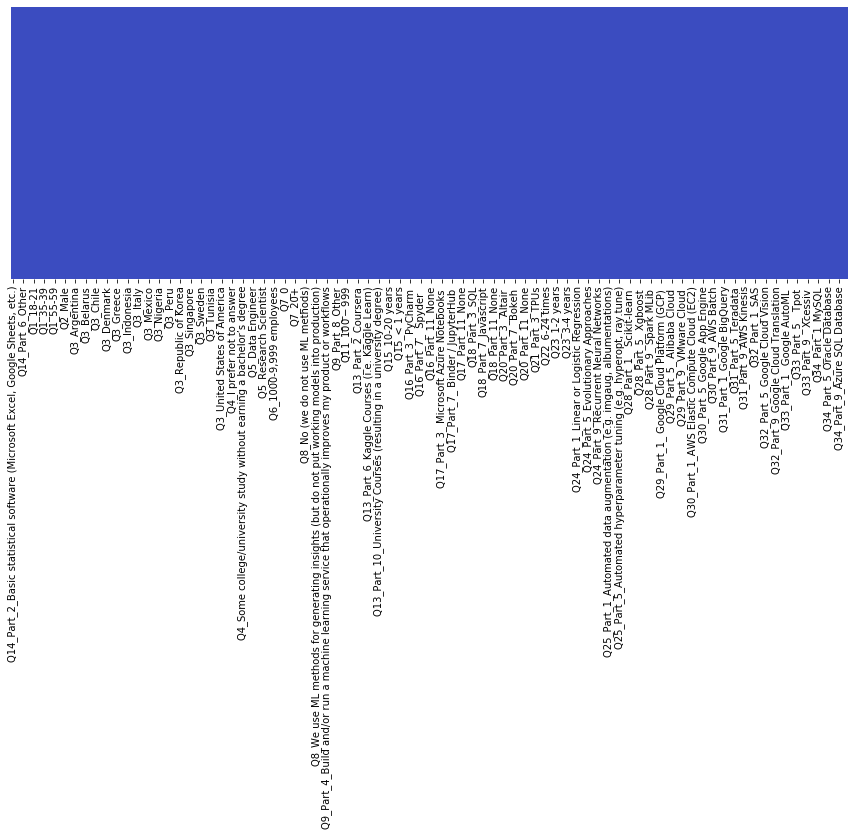

In [32]:
#creating a heatmap to see if we have any NaN in the dataset now or not.
null_val = kaggle_df_with_dummies.isnull()
fig, ax = plt.subplots(figsize=(15,5))
sns.heatmap(null_val, cmap='coolwarm', yticklabels=False, cbar=False, ax=ax)

# 2. Exploratory Data Analysis-----------------

Exploration of the data is done mainly with respect to three aspects, country, age and education. In all the aspects, let's first group/classify the data on the basis of some categories, visualize this data in comparison to the salary buckets in the dataframe to understand the trends of the dataset with respect to these aspects.

1. On the Basis of Country:
    
We have divided the dataset into continents based on the countries. The Classification has been picked from the following document.


Source: https://simple.wikipedia.org/wiki/List_of_countries_by_continents
    

We will now join the various columns for countries formed due to one hot encoding. We will also create another column that maps the same countries to a category.  We will be grouping the countries based on the developed and developing countries. This is done in order to carry out exploratory data analysis. 


In [33]:
#Categorizing the countries on the basis of continents
d = {'Country': ['Q3_Algeria','Q3_Argentina','Q3_Australia','Q3_Austria','Q3_Bangladesh','Q3_Belarus','Q3_Belgium','Q3_Brazil','Q3_Canada','Q3_Chile','Q3_China','Q3_Colombia','Q3_Czech Republic','Q3_Denmark','Q3_Egypt','Q3_France','Q3_Germany','Q3_Greece','Q3_Hong Kong (S.A.R.)','Q3_Hungary','Q3_India','Q3_Indonesia','Q3_Iran, Islamic Republic of...','Q3_Ireland','Q3_Israel','Q3_Italy','Q3_Japan','Q3_Kenya','Q3_Malaysia','Q3_Mexico','Q3_Morocco','Q3_Netherlands','Q3_New Zealand','Q3_Nigeria','Q3_Norway','Q3_Pakistan','Q3_Peru','Q3_Philippines','Q3_Poland','Q3_Portugal','Q3_Republic of Korea','Q3_Romania','Q3_Russia','Q3_Saudi Arabia','Q3_Singapore','Q3_South Africa','Q3_South Korea','Q3_Spain','Q3_Sweden','Q3_Switzerland','Q3_Taiwan','Q3_Thailand','Q3_Tunisia','Q3_Turkey','Q3_Ukraine','Q3_United Kingdom of Great Britain and Northern Ireland','Q3_United States of America']
     , 'Type': ['Africa','South America','Australia','Europe','Asia','Europe','Europe','South America','North America','South America','Asia','North America','Europe','Europe','Africa','Europe','Europe','Europe','Asia','Europe','Asia','Asia','Asia','Asia','Europe','Asia','Europe','Asia','Africa','Asia','North America','Africa','Europe','Australia','Africa','Europe','Asia','South America','Asia','Europe','Europe','Asia','Europe','Europe','Asia','Asia','Africa','Asia','Europe','Europe','Asia','Asia','Africa','Asia','Europe','Europe','North America']
    , 'Name': ['Algeria','Argentina','Australia','Austria','Bangladesh','Belarus','Belgium','Brazil','Canada','Chile','China','Colombia','Czech Republic','Denmark','Egypt','France','Germany','Greece','Hong Kong (S.A.R.)','Hungary','India','Indonesia','Iran, Islamic Republic of...','Ireland','Israel','Italy','Japan','Kenya','Malaysia','Mexico','Morocco','Netherlands','New Zealand','Nigeria','Norway','Pakistan','Peru','Philippines','Poland','Portugal','Republic of Korea','Romania','Russia','Saudi Arabia','Singapore','South Africa','South Korea','Spain','Sweden','Switzerland','Taiwan','Thailand','Tunisia','Turkey','Ukraine','United Kingdom of Great Britain and Northern Ireland','United States of America']}
Country = pd.DataFrame(data=d)

In [34]:
#reading from the Country CSV
#Getting Names for the Columns which contain various countries
country_column_names = Country['Country'].tolist()
test = kaggle_df_with_dummies.copy()
#running a loop for every country 
for i in [country_column_names]:
    #Replacing 0 with null and 1 with the column Name
    test[i] = np.where(test[i]==0, '', i)
#Joining all country columns to give us one column
test['Country'] = test[country_column_names].apply(lambda x: ''.join(x), axis=1)
#dropping all the rest of the columns 
test = test.drop(country_column_names, axis=1)
#Merging with the CSV to get the name of the countries and their Category(Developed Vs Developing) from the COlumn Names
test = pd.merge(test,Country ,how='left',  on=['Country'])
#Dropping the column with COuntry_Columns
test = test.drop(['Country'], axis = 1)
#Because the data was one hot encoding where one category was dropped as the last category is logically not required, we have to manually add those values
test['Name'] = test['Name'].replace('', 'Vietnam')
test['Type'] = test['Type'].replace('', 'Asia')

Text(0.5, 1.0, 'Strength of Various Countries in the Data')

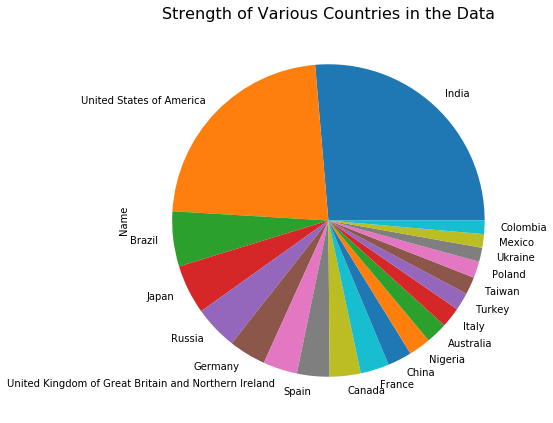

In [35]:
#Plotting the Number of Records for Each Country
plt.figure(figsize = [7,8])
test['Name'].value_counts().sort_values(ascending=False)[:20].plot(kind='pie')
plt.title("Strength of Various Countries in the Data", fontsize=16)
#plt.xlabel("No of Records", fontsize=14)

Observation: The number of Respondants from India are maximum followed by the respondents from the United States of America in the provided dataset.

Text(0.5, 1.0, 'Continent wise data/records distribution')

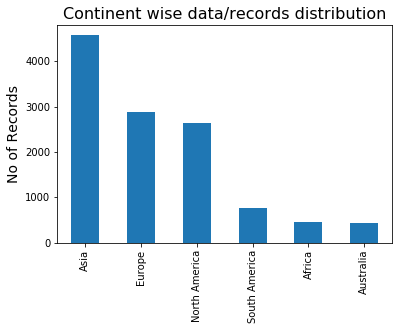

In [36]:
#Plotting No of Records for each category
test['Type'].value_counts().plot(kind='bar')
plt.ylabel("No of Records", fontsize = 14)
plt.title("Continent wise data/records distribution", fontsize = 16)

Observation: The Number of Records for the categories are approximately the same. Let's explore further on this trend.

In [37]:
#Converting the Target Variable Salary into float
test['Q10_buckets'] = test['Q10_buckets'].astype(float)

Text(0.5, 0, 'Mean Salaries')

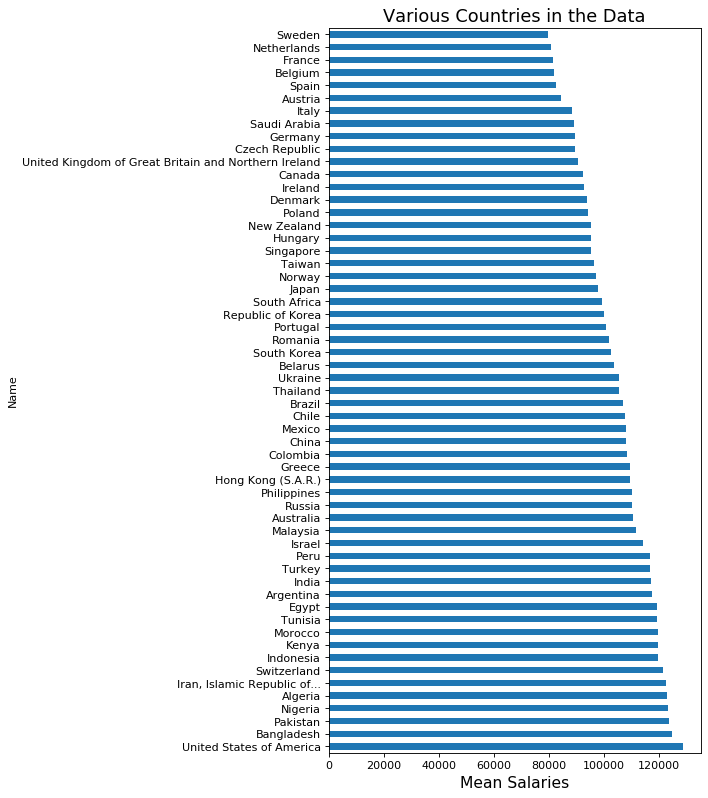

In [38]:
#Plotting the Avaerage Salaries for every Country
plt.figure(num=None, figsize=(6, 12), dpi=80)
#Getting the mean Salary for every Country
test.groupby(['Name'])['Q10_buckets'].mean().sort_values(ascending=False).plot(kind='barh')
plt.title("Various Countries in the Data", fontsize=16)
plt.xlabel("Mean Salaries", fontsize=14)

Text(0.5, 1.0, 'Continent wise salary distribution')

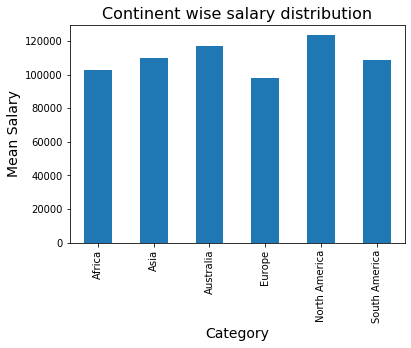

In [39]:
#Getting the mean Salary For the two Categories of Countries and plotting them
test.groupby(['Type'])['Q10_buckets'].mean().plot(kind='bar')
plt.ylabel("Mean Salary", fontsize = 14)
plt.xlabel("Category", fontsize = 14)
plt.title("Continent wise salary distribution", fontsize = 16)

The Graph further Strengthens our observation that countries besides the ones in North America have a lower average of Salaries.

**This Trend easily shows that if a person hails from North America, the probability of him/her having a higher salary is more compared to a person from any other country in any continent.**

#### 2. On the Basis of Age



We will again join all the columns for various age groups formed due to one hot encoding. We will Also add a category column. 

In [40]:
#Categorizing the age category into two: >30 and <30 years of age
d = {'Age': ['Q1_18-21','Q1_22-24','Q1_25-29','Q1_30-34','Q1_35-39','Q1_40-44','Q1_45-49','Q1_50-54','Q1_55-59','Q1_60-69','Q1_70+']
     , 'Age Strata': ['<30','<30','<30','>30','>30','>30','>30','>30','>30','>30','>30']
    , 'Age Group':['18-21','22-24','25-29','30-34','35-39','40-44','45-49','50-54','55-59','60-69','70+']}
Age = pd.DataFrame(data=d)

In [41]:
#Importing the Age CSV
#Getting the Column Names from the CSV
age_column_names = Age['Age'].tolist()
#Creating a copy of the Dataset
test = kaggle_df_with_dummies.copy()
#RUnning a loop for every Column Name
for i in [age_column_names]:
    #Replacing 0 with null and 1 with the Column name
    test[i] = np.where(test[i]==0, '', i)
#joining the COlumns
test['Age'] = test[age_column_names].apply(lambda x: ''.join(x), axis=1)
test = test.drop(age_column_names, axis=1)
#Merging with the Csv to get AGe Groups and the Category
test = pd.merge(test,Age ,how='left',  on=['Age'])
test = test.drop(['Age'], axis = 1)
#Replacing Values for the Last group which were removed as a part of one hot encoding
test['Age Strata'] = test['Age Strata'].replace(np.nan, '>30')
test['Age Group'] = test['Age Group'].replace(np.nan, '80+')

Text(0.5, 1.0, 'Strength of Various Age Groups in the Data')

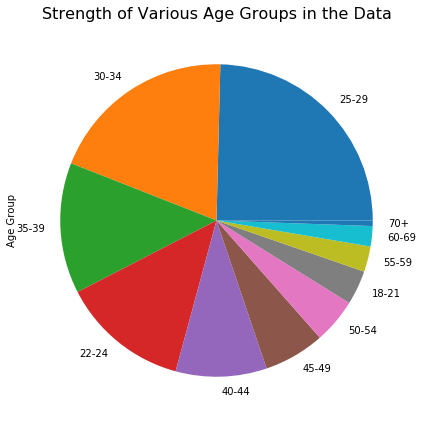

In [42]:
#Plotting the Number of Records for Each Age Group
plt.figure(figsize = [7,8])
test['Age Group'].value_counts().sort_values(ascending=False).plot(kind='pie')
plt.title("Strength of Various Age Groups in the Data", fontsize=16)
#plt.xlabel("No of Records", fontsize=14)

Observation: People in their 20s were amongst the highest respondents

Text(0.5, 1.0, '<30 Vs >30')

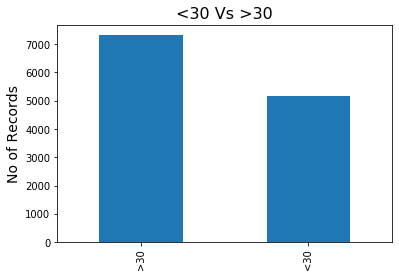

In [43]:
#Plotting No of Records for each category
test['Age Strata'].value_counts().plot(kind='bar')
plt.ylabel("No of Records", fontsize = 14)
plt.title("<30 Vs >30", fontsize = 16)

Observation: The total number of respondants above and below the age of 30 are approximately the same.

In [44]:
#Converting the Target Variable Salary into float
test['Q10_buckets'] = test['Q10_buckets'].astype(float)

Text(0.5, 0, 'Mean Salaries')

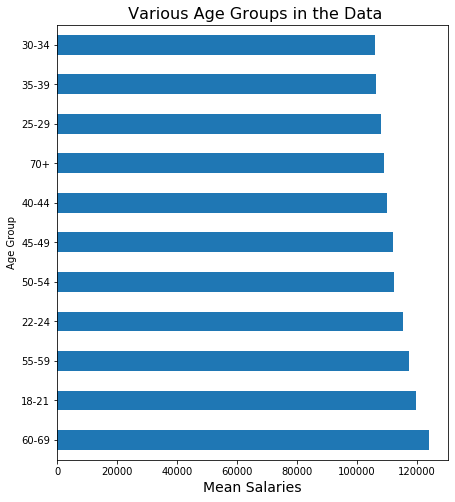

In [45]:
#Plotting the Average Salary for Each Age Group
plt.figure(figsize = [7,8])
test.groupby(['Age Group'])['Q10_buckets'].mean().sort_values(ascending=False).plot(kind='barh')
plt.title(" Various Age Groups in the Data", fontsize=16)
plt.xlabel("Mean Salaries", fontsize=14)

Observation: The Average Salaries of people grew as per the age, with an expection for the category of 70+ age.

Text(0.5, 1.0, '<30 Vs >30')

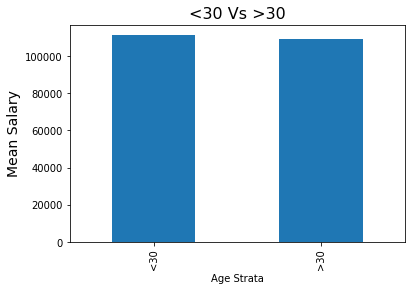

In [46]:
#Plotting Mean Salary for each category
test['Q10_buckets'] = test['Q10_buckets'].astype(float)
test.groupby(['Age Strata'])['Q10_buckets'].mean().plot(kind='bar')
plt.ylabel("Mean Salary", fontsize = 14)
plt.title("<30 Vs >30", fontsize = 16)

Observation: The Average Salaries of people below the Age of 30 is almost same as that of people above 30.
    
   **This trend also shows that people who are in their 30s or more have a higher chance of getting a good yearly compensation than those below 30.**

#### 3. On the basis of Education



In [47]:
#Categorizing for Education level based on two categories: <Master's and >=Master's
d = {'Degree': ["Q4_Bachelor’s degree",'Q4_Doctoral degree','Q4_I prefer not to answer',"Q4_Master’s degree",'Q4_No formal education past high school','Q4_Professional degree']
     , 'Strata': ['<Masters','>=Masters','I prefer not to answer','>=Masters','<Masters','<Masters']
    , 'Type':["Bachelor’s degree",'Doctoral degree','I prefer not to answer',"Master’s degree",'No formal education past high school','Professional degree']}
Education = pd.DataFrame(data=d)

In [48]:
#Importing the Education CSV
#Getting the COlumn names for education
education_column_names = Education['Degree'].tolist()
#Creating a copy of the Dataset
test = kaggle_df_with_dummies.copy()
#Running a loop for every Edcaucation COlumn
for i in [education_column_names]:
    #Replaicng 0 with null and 1 with the column Name
    test[i] = np.where(test[i]==0, '', i)
    #Joining all the Education COlumns 
test['Degree'] = test[education_column_names].apply(lambda x: ''.join(x), axis=1)
#Dropping the Individual COlumns
test = test.drop(education_column_names, axis=1)
#Dropping the rows where people Refused to tell their Education Level
test = test[test.Degree != 'Q4_I prefer not to answer' ]
#Merging with the Education CSV to get the Education Level and the Category
test = pd.merge(test,Education ,how='left',  on=['Degree'])
test = test.drop(['Degree'], axis = 1)
#Replaicng the missing values due to one of the Education levels was dropped during One Hot Encoding. 
#During One HOt Encoding it makes sense to not use one of the Categories in a column as it is self understood.
test['Strata'] = test['Strata'].replace(np.nan, '<Masters')
test['Type'] = test['Type'].replace(np.nan, "Some college/university study without earning a bachelor's degree")

Text(0.5, 1.0, ' Various Education Levels in the Data')

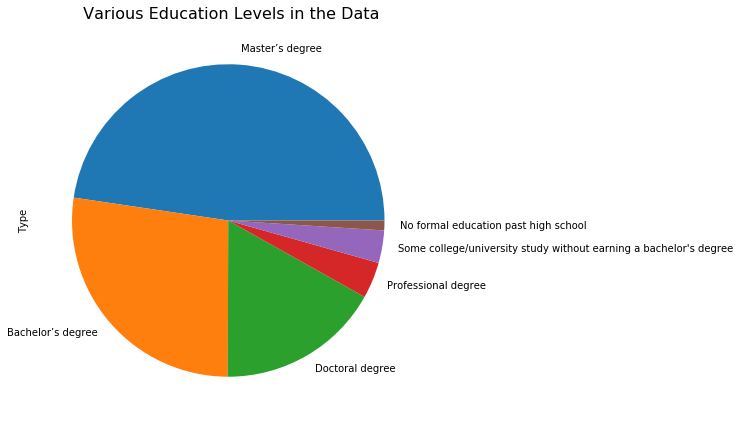

In [49]:
#Plotting the Average Salary for Each Education Level
plt.figure(figsize = [7,8])
test['Type'].value_counts().sort_values(ascending=False).plot(kind='pie')
plt.title(" Various Education Levels in the Data", fontsize=16)
#plt.xlabel("Number Of Records", fontsize=14)

Observation: People with Masters Degree were the maximum who responded to the survey.

Text(0.5, 1.0, '<Masters Vs >Masters')

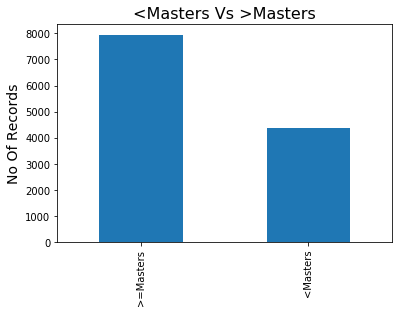

In [50]:
#Plotting Number of Records for each category
test['Strata'].value_counts().plot(kind='bar')
plt.ylabel("No Of Records", fontsize = 14)
plt.title("<Masters Vs >Masters", fontsize = 16)

Due to the high number of respondants to the Masters Category there was no level for which as equal set could be obtained. So going ahead with this split.

In [51]:
#Converting the Target Variable to Float
test['Q10_buckets'] = test['Q10_buckets'].astype(float)

Text(0, 0.5, '')

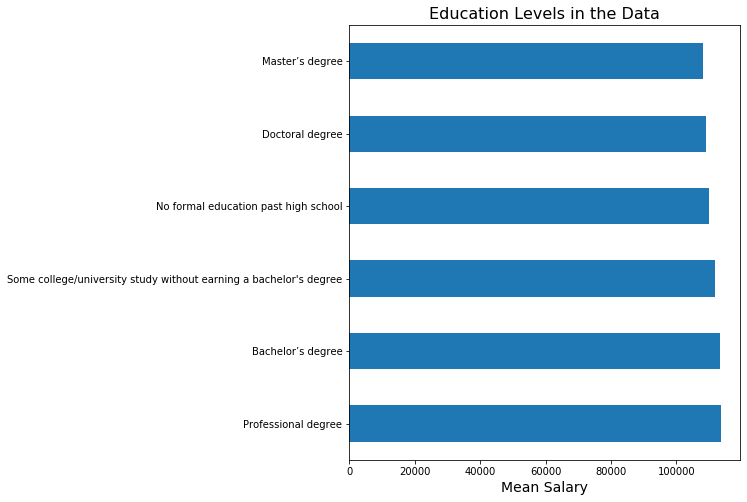

In [52]:
#Plotting the Average Salary for Education Level
plt.figure(figsize = [7,8])
test.groupby(['Type'])['Q10_buckets'].mean().sort_values(ascending=False).plot(kind='barh')
plt.title("Education Levels in the Data", fontsize=16)
plt.xlabel("Mean Salary", fontsize=14)
plt.ylabel("", fontsize=14)

Observation: There is a clear trend that higher the education, higher is the Salary. However, there is an exception for both No formal education after high school and some college/university study without eaning a bachelor's degree in the raw dataset which seems ambiguous.

Text(0.5, 1.0, '<Masters Vs >Masters')

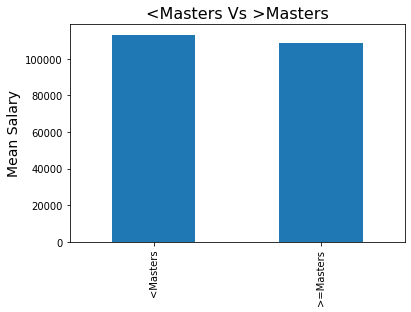

In [53]:
#Plotting Mean Salary for each category
test.groupby(['Strata'])['Q10_buckets'].mean().plot(kind='bar')
plt.ylabel("Mean Salary", fontsize = 14)
plt.xlabel("", fontsize = 14)
plt.title("<Masters Vs >Masters", fontsize = 16)

A good amount of the people from the catgories of No formal education past high school and Some college/university study without earning a bachelor's degree did not have the information for the salaries, so they were susbtituted with mean of the column and hence in the graph above, we can see that the people having lesser than Master's degree and the people having Master's degree and above have approximately same mean salaries.

In [54]:
#Removing the Q10_buckets column whihc was previously kept for the purpose of plotting the graphs
kaggle_df_with_dummies = kaggle_df_with_dummies.drop('Q10_buckets', axis =1)


In [55]:
kaggle_df_with_dummies

,"Q14_Part_2_Basic statistical software (Microsoft Excel, Google Sheets, etc.)","Q14_Part_3_Business intelligence software (Salesforce, Tableau, Spotfire, etc.)","Q14_Part_4_Cloud-based data software & APIs (AWS, GCP, Azure, etc.)","Q14_Part_5_Local development environments (RStudio, JupyterLab, etc.)",Q14_Part_6_Other,Q14_Nan,Q10_Encoded,Q1_18-21,Q1_22-24,Q1_25-29,Q1_30-34,Q1_35-39,Q1_40-44,Q1_45-49,Q1_50-54,Q1_55-59,Q1_60-69,Q1_70+,Q2_Female,Q2_Male,Q2_Prefer not to say,Q2_Prefer to self-describe,Q3_Algeria,Q3_Argentina,Q3_Australia,Q3_Austria,Q3_Bangladesh,Q3_Belarus,Q3_Belgium,Q3_Brazil,Q3_Canada,Q3_Chile,Q3_China,Q3_Colombia,Q3_Czech Republic,Q3_Denmark,Q3_Egypt,Q3_France,Q3_Germany,Q3_Greece,Q3_Hong Kong (S.A.R.),Q3_Hungary,Q3_India,Q3_Indonesia,"Q3_Iran, Islamic Republic of...",Q3_Ireland,Q3_Israel,Q3_Italy,Q3_Japan,Q3_Kenya,Q3_Malaysia,Q3_Mexico,Q3_Morocco,Q3_Netherlands,Q3_New Zealand,Q3_Nigeria,Q3_Norway,Q3_Other,Q3_Pakistan,Q3_Peru,Q3_Philippines,Q3_Poland,Q3_Portugal,Q3_Republic of Korea,Q3_Romania,Q3_Russia,Q3_Saudi Arabia,Q3_Singapore,Q3_South Africa,Q3_South Korea,Q3_Spain,Q3_Sweden,Q3_Switzerland,Q3_Taiwan,Q3_Thailand,Q3_Tunisia,Q3_Turkey,Q3_Ukraine,Q3_United Kingdom of Great Britain and Northern Ireland,Q3_United States of America,Q3_Viet Nam,Q4_Bachelor’s degree,Q4_Doctoral degree,Q4_I prefer not to answer,Q4_Master’s degree,Q4_No formal education past high school,Q4_Professional degree,Q4_Some college/university study without earning a bachelor’s degree,Q5_Business Analyst,Q5_DBA/Database Engineer,Q5_Data Analyst,Q5_Data Engineer,Q5_Data Scientist,Q5_Other,Q5_Product/Project Manager,Q5_Research Scientist,Q5_Software Engineer,Q5_Statistician,Q6_0-49 employees,"Q6_1000-9,999 employees",Q6_250-999 employees,Q6_50-249 employees,"Q6_> 10,000 employees",Q7_0,Q7_1-2,Q7_10-14,Q7_15-19,Q7_20+,Q7_3-4,Q7_5-9,Q8_I do not know,Q8_No (we do not use ML methods),Q8_We are exploring ML methods (and may one day put a model into production),"Q8_We have well established ML methods (i.e., models in production for more than 2 years)","Q8_We recently started using ML methods (i.e., models in production for less than 2 years)",Q8_We use ML methods for generating insights (but do not put working models into production),Q9_Part_1_Analyze and understand data to influence product or business decisions,"Q9_Part_2_Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Q9_Part_3_Build prototypes to explore applying machine learning to new areas,Q9_Part_4_Build and/or run a machine learning service that operationally improves my product or workflows,Q9_Part_5_Experimentation and iteration to improve existing ML models,Q9_Part_6_Do research that advances the state of the art of machine learning,Q9_Part_7_None of these activities are an important part of my role at work,Q9_Part_8_Other,Q11_$0 (USD),Q11_$1-$99,"Q11_$10,000-$99,999",Q11_$100-$999,"Q11_$1000-$9,999","Q11_> $100,000 ($USD)",Q13_Part_1_Udacity,Q13_Part_2_Coursera,Q13_Part_3_edX,Q13_Part_4_DataCamp,Q13_Part_5_DataQuest,Q13_Part_6_Kaggle Courses (i.e. Kaggle Learn),Q13_Part_7_Fast.ai,Q13_Part_8_Udemy,Q13_Part_9_LinkedIn Learning,Q13_Part_10_University Courses (resulting in a university degree),Q13_Part_11_None,Q13_Part_12_Other,Q15_1-2 years,Q15_10-20 years,Q15_20+ years,Q15_3-5 years,Q15_5-10 years,Q15_< 1 years,Q15_I have never written code,"Q16_Part_1_Jupyter (JupyterLab, Jupyter Notebooks, etc)",Q16_Part_2_ RStudio,Q16_Part_3_ PyCharm,Q16_Part_4_ Atom,Q16_Part_5_ MATLAB,Q16_Part_6_ Visual Studio / Visual Studio Code,Q16_Part_7_ Spyder,Q16_Part_8_ Vim / Emacs,Q16_Part_9_ Notepad++,Q16_Part_10_ Sublime Text,Q16_Part_11_None,Q16_Part_12_Other,Q17_Part_1_ Kaggle Notebooks (Kernels),Q17_Part_2_ Google Colab,Q17_Part_3_ Microsoft Azure Notebooks,"Q17_Part_4_ Google Cloud Notebook Products (AI Platform, Datalab, etc)",Q17_Part_5_ Paperspace / Gradient,Q17_Part_6_ FloydHub,Q17_Part_7_ Binder / JupyterHub,Q17_Part_8_ IBM Watson 

In [56]:
kaggle_df_with_dummies.shape

(12497, 319)

# 3. Feature Selection and Feature Importance--------------

Importance of Feature Selection

Unnecessary features decrease training speed, decrease model interpretability, and, most importantly, decrease generalization performance on the test set.

It helps to use only the most relevant and useful data in machine learning training sets, which dramatically reduces costs and data volume.


Random forests algorithms are used for classification and regression. The random forest is an ensemble learning method, composed of multiple decision trees. By averaging out the impact of several decision trees, random forests tend to improve prediction.

Random forests tend to shine in scenarios where a model has a large number of features that individually have weak predicative power but much stronger power collectively.

In [57]:
#Splitting the dataframe
X = kaggle_df_with_dummies.drop('Q10_Encoded',axis=1)
y = kaggle_df_with_dummies['Q10_Encoded']

In [58]:
# implementing train-test-split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [59]:
# random forest model creation
rfc = SelectFromModel(RandomForestClassifier())
rfc.fit(X_train,y_train)

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


SelectFromModel(estimator=RandomForestClassifier(bootstrap=True,
                                                 class_weight=None,
                                                 criterion='gini',
                                                 max_depth=None,
                                                 max_features='auto',
                                                 max_leaf_nodes=None,
                                                 min_impurity_decrease=0.0,
                                                 min_impurity_split=None,
                                                 min_samples_leaf=1,
                                                 min_samples_split=2,
                                                 min_weight_fraction_leaf=0.0,
                                                 n_estimators='warn',
                                                 n_jobs=None, oob_score=False,
                                                 random_state=None, verbose=0,

In [60]:
rfc.get_support()

array([ True,  True,  True,  True,  True, False,  True,  True,  True,
        True,  True,  True,  True,  True, False, False, False,  True,
        True, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False,  True, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False,  True,  True, False,  True,
        True, False,  True, False, False, False,  True, False,  True,
       False,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False, False,  True,  True,  True,
        True,  True,

In [61]:
#Sorting out the features selected by the Random Forest Classifier
selected_feat= X_train.columns[(rfc.get_support())]
len(selected_feat)

145

In [62]:
print(selected_feat)

Index(['Q14_Part_2_Basic statistical software (Microsoft Excel, Google Sheets, etc.)',
       'Q14_Part_3_Business intelligence software (Salesforce, Tableau, Spotfire, etc.)',
       'Q14_Part_4_Cloud-based data software & APIs (AWS, GCP, Azure, etc.)',
       'Q14_Part_5_Local development environments (RStudio, JupyterLab, etc.)',
       'Q14_Part_6_Other', 'Q1_18-21', 'Q1_22-24', 'Q1_25-29', 'Q1_30-34',
       'Q1_35-39',
       ...
       'Q30_Part_11_None', 'Q31_Part_11_None', 'Q32_Part_11_None',
       'Q33_Part_11_None', 'Q34_Part_1_MySQL', 'Q34_Part_2_PostgresSQL',
       'Q34_Part_3_SQLite', 'Q34_Part_4_Microsoft SQL Server',
       'Q34_Part_5_Oracle Database', 'Q34_Part_11_None'],
      dtype='object', length=145)


In [63]:
#Forming the dataframe with the selected features
kaggle_reduced = kaggle_df_with_dummies[selected_feat]

In [64]:
kaggle_reduced['Q10_Encoded'] = y

C:\Users\Shreyas\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [65]:
kaggle_reduced.shape

(12497, 146)

Random Forest Classifier helped in reducing the number of features from 343 features to 139 features. Now, this size of features is also too big to work with, hence applying the correlation filter threshold with respect to the target feature and keeping the threshold of 0.2, as anything below that would be considered to be in weak correlation with the intended feature.

For feature importance, mutual info classification is used which is imported from feature selection of scikit library. 

Mutual Info Classification estimates mutual information for a discrete target variable.

Mutual information (MI) between two random variables is a non-negative value, which measures the dependency between the variables. It is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.

In [66]:
#Feature Importance
#Apply mutual info classification to target veriables and features
kdf1 = kaggle_reduced.drop('Q10_Encoded', axis=1)
feat_imp = pd.DataFrame()
feat_imp['Feature'] = kdf1.columns
feat_imp['MI'] = mutual_info_classif(kdf1,kaggle_reduced['Q10_Encoded'])

In [67]:
#Plot MI against all features
plt.figure(figsize = (150,40))
ax = sns.barplot(data = feat_imp.reset_index(), x = 'Feature', y = 'MI')
ax.set_xticklabels(ax.get_xticklabels(), fontsize=60)
ax.yaxis.set_tick_params(labelsize=60)
plt.title("Feature Importance Plot", size=80)
plt.ylabel(" ")
for item in ax.get_xticklabels():
    item.set_rotation(90)

In [68]:
#Finding the correlation of the features with respect to the target variable
corr_matrix=kaggle_reduced.corr()
corr_matrix_values = corr_matrix["Q10_Encoded"].sort_values(ascending=False)
related_features = corr_matrix_values[corr_matrix_values>0.2]
related_features

Q10_Encoded                                                                                  1.000000
Q3_United States of America                                                                  0.553652
Q11_> $100,000 ($USD)                                                                        0.290760
Q9_Part_3_Build prototypes to explore applying machine learning to new areas                 0.259937
Q15_10-20 years                                                                              0.244552
Q8_We have well established ML methods (i.e., models in production for more than 2 years)    0.233497
Q9_Part_1_Analyze and understand data to influence product or business decisions             0.202630
Q11_$10,000-$99,999                                                                          0.202126
Name: Q10_Encoded, dtype: float64

We compared the correlation of the features with the target varibale and saw target variable 'Q10_Encoded' is highly correlated with features as shown above, keeping the threshold of correlation to ones above 0.2, and hence we would keep the features and drop the other.Then we check with other variable same process is followed until last variable. We are left with five features Q3,Q8,Q9,Q11,Q15. These are the final features, let's get all the parts of these questions and form a final feature engineered dataframe. 

Now, getting the final dataset containing all the columns of the features shown above. 

In [69]:
#Forming the copy of the original Dataframe, so as to keep it intact and free from any changes 
kaggle_final_df = kaggle_df_with_dummies.copy()

In [70]:
#Getting the locations of the columns in order to select the required columns for the new Dataframe
{kaggle_df_with_dummies.columns.get_loc(c):c for idx, c in enumerate(kaggle_df_with_dummies.columns)}

{0: 'Q14_Part_2_Basic statistical software (Microsoft Excel, Google Sheets, etc.)',
 1: 'Q14_Part_3_Business intelligence software (Salesforce, Tableau, Spotfire, etc.)',
 2: 'Q14_Part_4_Cloud-based data software & APIs (AWS, GCP, Azure, etc.)',
 3: 'Q14_Part_5_Local development environments (RStudio, JupyterLab, etc.)',
 4: 'Q14_Part_6_Other',
 5: 'Q14_Nan',
 6: 'Q10_Encoded',
 7: 'Q1_18-21',
 8: 'Q1_22-24',
 9: 'Q1_25-29',
 10: 'Q1_30-34',
 11: 'Q1_35-39',
 12: 'Q1_40-44',
 13: 'Q1_45-49',
 14: 'Q1_50-54',
 15: 'Q1_55-59',
 16: 'Q1_60-69',
 17: 'Q1_70+',
 18: 'Q2_Female',
 19: 'Q2_Male',
 20: 'Q2_Prefer not to say',
 21: 'Q2_Prefer to self-describe',
 22: 'Q3_Algeria',
 23: 'Q3_Argentina',
 24: 'Q3_Australia',
 25: 'Q3_Austria',
 26: 'Q3_Bangladesh',
 27: 'Q3_Belarus',
 28: 'Q3_Belgium',
 29: 'Q3_Brazil',
 30: 'Q3_Canada',
 31: 'Q3_Chile',
 32: 'Q3_China',
 33: 'Q3_Colombia',
 34: 'Q3_Czech Republic',
 35: 'Q3_Denmark',
 36: 'Q3_Egypt',
 37: 'Q3_France',
 38: 'Q3_Germany',
 39: 'Q3_G

In [71]:
#Including all columns of Q3
kdf3 = kaggle_final_df[kaggle_df_with_dummies.columns[22:81]]

In [72]:
kdf3.shape

(12497, 59)

In [73]:
#Including all columns of Q8
kdf8 = kaggle_final_df[kaggle_df_with_dummies.columns[110:116]]

In [74]:
kdf8.shape

(12497, 6)

In [75]:
#Including all columns of Q9
kdf9 = kaggle_final_df[kaggle_df_with_dummies.columns[116:124]]

In [76]:
kdf9.shape

(12497, 8)

In [77]:
#Including all the columns of Q11
kdf11 = kaggle_final_df[kaggle_df_with_dummies.columns[124:130]]

In [78]:
kdf11.shape

(12497, 6)

In [79]:
#Including all the columns of Q15
kdf15 = kaggle_final_df[kaggle_df_with_dummies.columns[142:149]]

In [80]:
kdf15.shape

(12497, 7)

In [81]:
#Including target variable column
kdft = kaggle_final_df[kaggle_df_with_dummies.columns[6]]

In [82]:
kdft.shape

(12497,)

In [83]:
#Concatenating all the above selected features into one final feature engineered dataset
kdf = pd.concat([kdf3, kdf8,kdf9,kdf11,kdf15, kdft],axis =1)

In [84]:
kdf.shape

(12497, 87)

In [85]:
#Final feature engineered dataset
kdf

,Q3_Algeria,Q3_Argentina,Q3_Australia,Q3_Austria,Q3_Bangladesh,Q3_Belarus,Q3_Belgium,Q3_Brazil,Q3_Canada,Q3_Chile,Q3_China,Q3_Colombia,Q3_Czech Republic,Q3_Denmark,Q3_Egypt,Q3_France,Q3_Germany,Q3_Greece,Q3_Hong Kong (S.A.R.),Q3_Hungary,Q3_India,Q3_Indonesia,"Q3_Iran, Islamic Republic of...",Q3_Ireland,Q3_Israel,Q3_Italy,Q3_Japan,Q3_Kenya,Q3_Malaysia,Q3_Mexico,Q3_Morocco,Q3_Netherlands,Q3_New Zealand,Q3_Nigeria,Q3_Norway,Q3_Other,Q3_Pakistan,Q3_Peru,Q3_Philippines,Q3_Poland,Q3_Portugal,Q3_Republic of Korea,Q3_Romania,Q3_Russia,Q3_Saudi Arabia,Q3_Singapore,Q3_South Africa,Q3_South Korea,Q3_Spain,Q3_Sweden,Q3_Switzerland,Q3_Taiwan,Q3_Thailand,Q3_Tunisia,Q3_Turkey,Q3_Ukraine,Q3_United Kingdom of Great Britain and Northern Ireland,Q3_United States of America,Q3_Viet Nam,Q8_I do not know,Q8_No (we do not use ML methods),Q8_We are exploring ML methods (and may one day put a model into production),"Q8_We have well established ML methods (i.e., models in production for more than 2 years)","Q8_We recently started using ML methods (i.e., models in production for less than 2 years)",Q8_We use ML methods for generating insights (but do not put working models into production),Q9_Part_1_Analyze and understand data to influence product or business decisions,"Q9_Part_2_Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Q9_Part_3_Build prototypes to explore applying machine learning to new areas,Q9_Part_4_Build and/or run a machine learning service that operationally improves my product or workflows,Q9_Part_5_Experimentation and iteration to improve existing ML models,Q9_Part_6_Do research that advances the state of the art of machine learning,Q9_Part_7_None of these activities are an important part of my role at work,Q9_Part_8_Other,Q11_$0 (USD),Q11_$1-$99,"Q11_$10,000-$99,999",Q11_$100-$999,"Q11_$1000-$9,999","Q11_> $100,000 ($USD)",Q15_1-2 years,Q15_10-20 years,Q15_20+ years,Q15_3-5 years,Q15_5-10 years,Q15_< 1 years,Q15_I have never written code,Q10_Encoded
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,3
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,14
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,6
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,8
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,7


Therefore after feature selection and engineering, we get 87 features to work with. So,  moving forward and implementing the model.

# 4. Model Implementation------------------------

**Reference - Logistic Regression ipynb Notebook, Tutorial 5**

Here, regular logisitic regression model is not applicable as our Q10_Encoded columns has labels in the ordinal manner(meaning label 1 has greater value than label 0 and so forth). Hence, we will be implementing the ordinal logistic regression model here. In this, we will be splitting our labels 0-14 into binary classes named 0s and 1s. We will be implementing the binary logisitic regresssion model 14 times, each time changing the y_train split of the dataframe, starting with assigning class 0 to label 0 and class 1 to the rest of the labels (from 1 to 14), and consecutively assigning class 0 to labels 0, 1 and class 1 to the rest of the labels (from 2 to 14) and so on. Each time, we will be calculating the probability of class 0 and storing it in a variable. At the end, all the variables containing probabilities will be stored in a list and that will be compared with the y_test split of the dataset for yielding the accuracy of the model implemented. 

In [86]:
#Splitting the dataframe for separating the target variable
X1 = kdf.drop('Q10_Encoded',axis=1)
y1 = kdf['Q10_Encoded']


In [87]:
#Using train_test-split to split the data into training and testing data
from sklearn.model_selection import train_test_split 
  
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size = 0.2, random_state = 0) 


In [88]:
#Checking the shape of training and testing data
print(X_train1.shape)
print(X_test1.shape)
print(y_train1.shape)
print(y_test1.shape)

(9997, 86)
(2500, 86)
(9997,)
(2500,)


# ----------------Implementing Logistic Regression for all Labels----------------------

In [89]:
#Defining the Logistic Regression model
model = LogisticRegression()

In [90]:
#Classification 1 - label 0 - 0 ; Rest all - 1 
y_train_0 = y_train.map({0:0, 1:1, 2:1, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_0 = model.fit(X_train1, y_train_0)
prob_0 = model_0.predict_proba(X_test1)
class_0_prob_1 = prob_0[:,0]
class_0_prob_1

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.03226008, 0.19488631, 0.72331579, ..., 0.51881227, 0.65387163,
       0.05317375])

In [91]:
#Classification 2 - label 0 - 0,1 ; Rest all - 1 
y_train_1 = y_train.map({0:0, 1:0, 2:1, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_1 = model.fit(X_train1, y_train_1)
prob_1 = model_1.predict_proba(X_test1)
class_0_prob_2  = prob_1[: ,0] - prob_0[:,0]
class_0_prob_2


C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.00508294, 0.04037824, 0.10405864, ..., 0.21988957, 0.15104464,
       0.04305352])

In [92]:
#Classification 3 - label 0 - 0,1,2 ; Rest all - 1 
y_train_2 = y_train.map({0:0, 1:0, 2:0, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_2 = model.fit(X_train1, y_train_2)
prob_2 = model_2.predict_proba(X_test1)
class_0_prob_3 = prob_2[: ,0] - prob_1[: ,0]

class_0_prob_3

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.00698273, 0.03895002, 0.04883212, ..., 0.10124355, 0.0622731 ,
       0.07563929])

In [93]:
#Classification 4 - label 0 - 0,1,2,3 ; Rest all - 1 
y_train_3 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_3 = model.fit(X_train1, y_train_3)
prob_3 = model_3.predict_proba(X_test1)
class_0_prob_4 = prob_3[: ,0]- prob_2[: ,0]

class_0_prob_4

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.00158579, 0.02093131, 0.03846409, ..., 0.0517316 , 0.03326829,
       0.17482278])

In [94]:
#Classification 5 - label 0 - 0,1,2,3,4 ; Rest all - 1 
y_train_4 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_4 = model.fit(X_train1, y_train_4)
prob_4 = model_4.predict_proba(X_test1)
class_0_prob_5 = prob_4[: ,0] - prob_3[: ,0]

class_0_prob_5

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.01823882, 0.08674073, 0.01587097, ..., 0.02365976, 0.03626112,
       0.21198988])

In [95]:
#Classification 6 - label 0 - 0,1,2,3,4,5 ; Rest all - 1 
y_train_5 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_5 = model.fit(X_train1, y_train_5)
prob_5 = model_5.predict_proba(X_test1)
class_0_prob_6  = prob_5[: ,0] - prob_4[: ,0]

class_0_prob_6 

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.03702732, 0.03566654, 0.03657483, ..., 0.02176765, 0.01546146,
       0.11833328])

In [96]:
#Classification 7 - label 0 - 0,1,2,3,4,5,6 ; Rest all - 1 
y_train_6 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_6 = model.fit(X_train1, y_train_6)
prob_6 = model_6.predict_proba(X_test1)
class_0_prob_7 = prob_6[: ,0] - prob_5[: ,0]

class_0_prob_7

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.04296512, 0.08543887, 0.00273343, ..., 0.00676992, 0.01703323,
       0.12471285])

In [97]:
#Classification 8 - label 0 - 0,1,2,3,4,5,6,7 ; Rest all - 1 
y_train_7 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_7 = model.fit(X_train1, y_train_7)
prob_7 = model_7.predict_proba(X_test1)
class_0_prob_8 = prob_7[: ,0] - prob_6[: ,0]

class_0_prob_8

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.04312508, 0.11305218, 0.01280201, ..., 0.01764744, 0.01042413,
       0.07943757])

In [98]:
#Classification 9 - label 0 - 0,1,2,3,4,5,6,7,8 ; Rest all - 1 
y_train_8 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_8 = model.fit(X_train1, y_train_8)
prob_8 = model_8.predict_proba(X_test1)
class_0_prob_9= prob_8[: ,0] - prob_7[: ,0]

class_0_prob_9

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.03617828, 0.0772398 , 0.00064063, ..., 0.00210417, 0.00325682,
       0.02179205])

In [99]:
#Classification 10 - label 0 - 0,1,2,3,4,5,6,7,8,9 ; Rest all - 1 
y_train_9 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:1, 11:1, 12:1, 13:1, 14:1})
model_9 = model.fit(X_train1, y_train_9)
prob_9 = model_9.predict_proba(X_test1)
class_0_prob_10 = prob_9[: ,0] - prob_8[: ,0]

class_0_prob_10 

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.04843896, 0.06462221, 0.00320716, ..., 0.00656895, 0.00033456,
       0.01070763])

In [100]:
#Classification 11 - label 0 - 0,1,2,3,4,5,6,7,8,9,10 ; 11,12,13,14 - label 1 
y_train_10 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:1, 12:1, 13:1, 14:1})
model_10 = model.fit(X_train1, y_train_10)
prob_10 = model_10.predict_proba(X_test1)
class_0_prob_11 = prob_10[: ,0] - prob_9[: ,0]

class_0_prob_11

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.25839825, 0.0994373 , 0.00282043, ..., 0.01034361, 0.00750384,
       0.05485102])

In [101]:
#Classification 12 - label 0 - 0,1,2,3,4,5,6,7,8,9,10,11 ; 12,13,14 - label 1 
y_train_11 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:1, 13:1, 14:1})
model_11 = model.fit(X_train1, y_train_11)
prob_11 = model_11.predict_proba(X_test1)
class_0_prob_12 = prob_11[: ,0] - prob_10[: ,0]

class_0_prob_12

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.24401075, 0.07947628, 0.00243597, ..., 0.00344609, 0.00610813,
       0.01140921])

In [102]:
#Classification 13 - label 0 - 0,1,2,3,4,5,6,7,8,9,10,11,12 ; 13,14 - label 1 
y_train_12 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:1, 14:1})
model_12 = model.fit(X_train1, y_train_12)
prob_12 = model_12.predict_proba(X_test1)
class_0_prob_13 = prob_12[: ,0] - prob_11[: ,0]

class_0_prob_13

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([ 0.17384447,  0.03701875,  0.00051164, ...,  0.00489572,
       -0.00067123,  0.01256848])

In [103]:
#Classification 14 - label 0 - 0,1,2,3,4,5,6,7,8,9,10,11,12,13 ; 14 - label 1 
y_train_13 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:1})
model_13 = model.fit(X_train1, y_train_13)
prob_13 = model_13.predict_proba(X_test1)
class_0_prob_14= prob_13[: ,0] - prob_12[: ,0]

class_0_prob_14

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


array([0.02969694, 0.01229162, 0.00421077, ..., 0.00726379, 0.00113868,
       0.00398939])

In [104]:
#Classification 15
class_0_prob_15  = 1 -prob_13[: ,0]

class_0_prob_15 

array([0.02216448, 0.01386986, 0.00352152, ..., 0.0038559 , 0.00269159,
       0.00351931])

In [105]:
#Class 0 probabilities consolidated into one list
class_0_prob_all = []
class_0_prob_all = [class_0_prob_1, class_0_prob_2, class_0_prob_3, class_0_prob_4, class_0_prob_5, class_0_prob_6, class_0_prob_7, class_0_prob_8, class_0_prob_9, class_0_prob_10, class_0_prob_11, class_0_prob_12, class_0_prob_13, class_0_prob_14, class_0_prob_15]

In [106]:
#Converting the list into a dataframe
class_0_prob_all = pd.DataFrame(class_0_prob_all)


In [107]:
#Converting some of the negative probabilites in the dataset to zero
class_0_prob_all[class_0_prob_all<0]=0

In [108]:
#Displaying the probabilities dataframe
class_0_prob_all

0         1         2         3         4         5         6     \
0   0.032260  0.194886  0.723316  0.099504  0.012596  0.533787  0.819248   
1   0.005083  0.040378  0.104059  0.027053  0.000000  0.222014  0.099443   
2   0.006983  0.038950  0.048832  0.031797  0.002561  0.100160  0.026298   
3   0.001586  0.020931  0.038464  0.030801  0.000852  0.045476  0.017283   
4   0.018239  0.086741  0.015871  0.039411  0.019491  0.032283  0.000000   
5   0.037027  0.035667  0.036575  0.085218  0.030708  0.016461  0.011659   
6   0.042965  0.085439  0.002733  0.090124  0.032166  0.009642  0.000000   
7   0.043125  0.113052  0.012802  0.109227  0.028560  0.014833  0.003308   
8   0.036178  0.077240  0.000641  0.106036  0.051533  0.005166  0.001038   
9   0.048439  0.064622  0.003207  0.073172  0.048517  0.000000  0.002676   
10  0.258398  0.099437  0.002820  0.156349  0.268965  0.009820  0.005099   
11  0.244011  0.079476  0.002436  0.068917  0.187931  0.002062  0.005435   
12  0.173844  0.037019  0.000512  0.050247  0.189101  0.001676  0.000520   
13  0.029697  0.012292  0.004211  0.019226  0.019222  0.003576  0.001896   
14  0.022164  0.013870  0.003522  0.012918  0.109387  0.003131  0.007309   

        7         8         9         10        11        12        13    \
0   0.656144  0.086483  0.096438  0.081021  0.161372  0.013279  0.532149   
1   0.181434  0.018033  0.117589  0.051729  0.019362  0.002040  0.179515   
2   0.071058  0.025847  0.146021  0.031906  0.078643  0.003294  0.118813   
3   0.016788  0.027928  0.074681  0.173191  0.049570  0.009041  0.041878   
4   0.014510  0.044945  0.179452  0.071795  0.136503  0.009205  0.046326   
5   0.010803  0.034398  0.100508  0.308728  0.157931  0.007873  0.029490   
6   0.002758  0.083530  0.075099  0.118965  0.176666  0.022939  0.020172   
7   0.014695  0.102372  0.060303  0.042382  0.077407  0.030133  0.006208   
8   0.002745  0.100471  0.028535  0.023655  0.060468  0.033707  0.006209   
9   0.003012  0.080698  0.018135  0.014322  0.039551  0.056620  0.002161   
10  0.012530  0.174671  0.074927  0.022701  0.022742  0.228720  0.008843   
11  0.000000  0.128890  0.000000  0.032093  0.011353  0.264529  0.002794   
12  0.003350  0.052891  0.019311  0.019976  0.003125  0.205324  0.001423   
13  0.000189  0.022466  0.008282  0.000929  0.000232  0.071098  0.000247   
14  0.010456  0.016375  0.004684  0.006606  0.005075  0.042198  0.003772   

        14        15        16        17        18        19        20    \
0   0.035478  0.392883  0.466465  0.199937  0.036178  0.538811  0.781443   
1   0.008218  0.216804  0.267408  0.308456  0.018088  0.063674  0.126858   
2   0.000192  0.156344  0.112300  0.153379  0.017783  0.025638  0.039649   
3   0.020037  0.065332  0.050362  0.103009  0.000000  0.038579  0.014052   
4   0.006909  0.035460  0.043801  0.124649  0.027705  0.054484  0.009574   
5   0.063748  0.036550  0.020525  0.015330  0.026666  0.100572  0.007548   
6   0.067838  0.007365  0.011283  0.015186  0.037211  0.059959  0.005241   
7   0.171118  0.022477  0.009672  0.026914  0.085846  0.041111  0.006706   
8   0.076548  0.017367  0.003339  0.009334  0.153834  0.031358  0.001418   
9   0.151205  0.006269  0.001346  0.010939  0.058186  0.013660  0.000000   
10  0.245523  0.017124  0.008649  0.018316  0.233259  0.023769  0.002594   
11  0.056042  0.004831  0.000473  0.005305  0.222734  0.003269  0.001860   
12  0.034645  0.013500  0.000000  0.000000  0.042766  0.001331  0.000000   
13  0.019163  0.000000  0.001558  0.001720  0.012484  0.000690  0.001267   
14  0.043336  0.007777  0.003418  0.008169  0.028842  0.003094  0.002794   

        21        22        23        24        25        26        27    \
0   0.669615  0.060819  0.020276  0.625723  0.035939  0.182587  0.538015   
1   0.163147  0.000000  0.009649  0.120576  0.003286  0.012057  0.192996   
2   0.073047  0.006319  0.033284  0.080637  0.005468  0.031900  0.102099   
3   0.022634  0.005982  0.114767  0.041441  0.000000 

In [109]:
#Finding the highest probabilities in each column
all_labels_prob = class_0_prob_all.idxmax(axis=0)
all_labels_prob

0       10
1        0
2        0
3       10
4       10
5        0
6        0
7        0
8       10
9        4
10       5
11       6
12      11
13       0
14      10
15       0
16       0
17       1
18      10
19       0
20       0
21       0
22      10
23       5
24       0
        ..
2475     0
2476     0
2477     0
2478     0
2479     0
2480     6
2481     4
2482     0
2483     0
2484    10
2485    10
2486    10
2487     0
2488    10
2489    10
2490     0
2491     6
2492    11
2493     0
2494    12
2495     0
2496     2
2497     0
2498     0
2499     4
Length: 2500, dtype: int64

# -----------------Calculating Accuracy of the models-------------------------

Comparing the probabilities of all the models consolidated into a list with the y_test split of the dataframe for determining accuracy of the ordinal logistic regression model implemented above

In [110]:
#Accuracy of the model
score =accuracy_score(y_test,all_labels_prob)
print("The Accuracy of the model is", score*100, "%")

The Accuracy of the model is 36.84 %


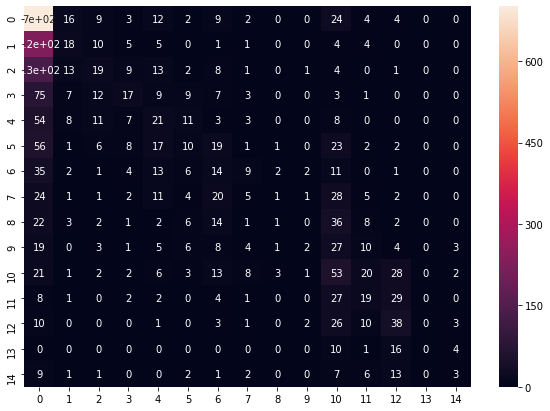

In [111]:
#Plotting the confusion matrix of the model
cm=confusion_matrix(y_test,all_labels_prob)
plt.figure(figsize = (10,7))
sns.heatmap(cm, annot=True)

In [112]:
#Classification report of the confusion matrix represented above
cr = classification_report(y_test,all_labels_prob)
print("\nClasification report:\n", cr)


Clasification report:
               precision    recall  f1-score   support

           0       0.50      0.89      0.64       786
           1       0.25      0.07      0.10       273
           2       0.25      0.09      0.14       204
           3       0.28      0.12      0.17       143
           4       0.18      0.17      0.17       126
           5       0.16      0.07      0.10       146
           6       0.11      0.14      0.12       100
           7       0.12      0.05      0.07       105
           8       0.11      0.01      0.02        98
           9       0.22      0.02      0.04        93
          10       0.18      0.33      0.23       163
          11       0.21      0.20      0.21        93
          12       0.27      0.40      0.32        94
          13       0.00      0.00      0.00        31
          14       0.20      0.07      0.10        45

    accuracy                           0.37      2500
   macro avg       0.20      0.17      0.16      2500
we

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


## 5. Hyperparameter Tuning and Cross Validation---------------------


Optimize Model: Grid Search
Grid searching is a well known method for selecting hyperparameters that optimize your model.

Grid search just builds several models with all the parameter combinations specified, and runs cross validation to return the set of parameters that had the highest cv score on the validation set.

For Model tuning method, Hyperparameter Tuning is selected

Performing Hyperparameter Tuning

In [113]:
#Defining function for hyperparameter tuning in order to facilitate easy calling of this whole code snippet
def hyperparameter_tuning(X,y):

    model = LogisticRegression()
    scaler = StandardScaler()
    kfold = KFold(n_splits=10)
    kfold.get_n_splits(X)

    best_model = model
    best_params = {}
    best_accuracy = 0
    best_std = 0

    for C in [0.001,0.01,0.05,0.1,0.5,1,5,10, 100]:
        for solver in ['newton-cg','lbfgs','liblinear']:
        
            model = LogisticRegression(C=C, solver=solver)
            accuracy = np.zeros(10)
            np_idx = 0
        
            for train_idx, test_idx in kfold.split(X):
                X_train, X_test = X.values[train_idx], X.values[test_idx]
                y_train, y_test = y.values[train_idx], y.values[test_idx]

                X_train = scaler.fit_transform(X_train)
                X_test = scaler.transform(X_test)

                model.fit(X_train, y_train)

                predictions = model.predict(X_test)

                ACC = accuracy_score(y_test, predictions)

                accuracy[np_idx] = ACC*100
                np_idx += 1
        
            if np.mean(accuracy) > best_accuracy:
                best_model = model
                best_params = {'C':C, 'solver':solver}
                best_accuracy = np.mean(accuracy)
                best_std = np.std(accuracy)

    print (best_params)
    print ("Best Score: {}%({}%)".format(round(best_accuracy,3),round(best_std,3)))      

    print ("\nThe optimal log model uses C={}, and a {} solver, and has a cross validation score of {}% with a standard deviation of {}%".format(best_params['C'],best_params['solver'],round(best_accuracy,3),round(best_std,3)))



In [114]:
#Mapping the y split of data into two classes
y1_0 = y1.map({0:0, 1:1, 2:1, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})

In [115]:
#Hyperparameter Tuning on model_0
hyperparameter_tuning(X1, y1_0)

{'C': 0.01, 'solver': 'newton-cg'}
Best Score: 77.33%(3.25%)

The optimal log model uses C=0.01, and a newton-cg solver, and has a cross validation score of 77.33% with a standard deviation of 3.25%


In [116]:
#Mapping the y split of data into two classes
y1_1 =  y1.map({0:0, 1:0, 2:1, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})

In [117]:
#Hyperparameter Tuning on model_1
hyperparameter_tuning(X1, y1_1)

{'C': 0.001, 'solver': 'newton-cg'}
Best Score: 79.61%(2.656%)

The optimal log model uses C=0.001, and a newton-cg solver, and has a cross validation score of 79.61% with a standard deviation of 2.656%


In [118]:
#Mapping the y split of data into two classes
y1_2 =  y1.map({0:0, 1:0, 2:0, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})

In [119]:
#Hyperparameter Tuning on model_2
hyperparameter_tuning(X1, y1_2)

{'C': 0.1, 'solver': 'liblinear'}
Best Score: 81.427%(1.987%)

The optimal log model uses C=0.1, and a liblinear solver, and has a cross validation score of 81.427% with a standard deviation of 1.987%


In [120]:
#Mapping the y split of data into two classes
y1_3 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})

In [121]:
#Hyperparameter Tuning on model_3
hyperparameter_tuning(X1, y1_3)

{'C': 0.05, 'solver': 'liblinear'}
Best Score: 82.508%(1.236%)

The optimal log model uses C=0.05, and a liblinear solver, and has a cross validation score of 82.508% with a standard deviation of 1.236%


In [122]:
#Mapping the y split of data into two classes
y1_4 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})

In [123]:
#Hyperparameter Tuning on model_4
hyperparameter_tuning(X1, y1_4)

{'C': 0.001, 'solver': 'newton-cg'}
Best Score: 83.924%(1.384%)

The optimal log model uses C=0.001, and a newton-cg solver, and has a cross validation score of 83.924% with a standard deviation of 1.384%


In [124]:
#Mapping the y split of data into two classes
y1_5 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})

In [125]:
#Hyperparameter Tuning on model_5
hyperparameter_tuning(X1, y1_5)

{'C': 0.05, 'solver': 'liblinear'}
Best Score: 85.14%(1.207%)

The optimal log model uses C=0.05, and a liblinear solver, and has a cross validation score of 85.14% with a standard deviation of 1.207%


In [126]:
#Mapping the y split of data into two classes
y1_6 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})

In [127]:
#Hyperparameter Tuning on model_6
hyperparameter_tuning(X1, y1_6)

{'C': 0.5, 'solver': 'newton-cg'}
Best Score: 86.101%(1.45%)

The optimal log model uses C=0.5, and a newton-cg solver, and has a cross validation score of 86.101% with a standard deviation of 1.45%


In [128]:
#Mapping the y split of data into two classes
y1_7 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})

In [129]:
#Hyperparameter Tuning on model_7
hyperparameter_tuning(X1, y1_7)

{'C': 1, 'solver': 'newton-cg'}
Best Score: 87.061%(1.396%)

The optimal log model uses C=1, and a newton-cg solver, and has a cross validation score of 87.061% with a standard deviation of 1.396%


In [130]:
#Mapping the y split of data into two classes
y1_8 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})

In [131]:
#Hyperparameter Tuning on model_8
hyperparameter_tuning(X1, y1_8)

{'C': 0.01, 'solver': 'liblinear'}
Best Score: 87.838%(1.93%)

The optimal log model uses C=0.01, and a liblinear solver, and has a cross validation score of 87.838% with a standard deviation of 1.93%


In [132]:
#Mapping the y split of data into two classes
y1_9 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:1, 11:1, 12:1, 13:1, 14:1})

In [133]:
#Hyperparameter Tuning on model_9
hyperparameter_tuning(X1, y1_9)

{'C': 0.01, 'solver': 'newton-cg'}
Best Score: 89.19%(1.872%)

The optimal log model uses C=0.01, and a newton-cg solver, and has a cross validation score of 89.19% with a standard deviation of 1.872%


In [134]:
#Mapping the y split of data into two classes
y1_10 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:1, 12:1, 13:1, 14:1})

In [135]:
#Hyperparameter Tuning on model_10
hyperparameter_tuning(X1, y1_10)

{'C': 0.05, 'solver': 'newton-cg'}
Best Score: 91.855%(2.105%)

The optimal log model uses C=0.05, and a newton-cg solver, and has a cross validation score of 91.855% with a standard deviation of 2.105%


In [136]:
#Mapping the y split of data into two classes
y1_11 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:1, 13:1, 14:1})

In [137]:
#Hyperparameter Tuning on model_11
hyperparameter_tuning(X1, y1_11)

{'C': 0.001, 'solver': 'liblinear'}
Best Score: 94.055%(1.682%)

The optimal log model uses C=0.001, and a liblinear solver, and has a cross validation score of 94.055% with a standard deviation of 1.682%


In [138]:
#Mapping the y split of data into two classes
y1_12 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:1, 14:1})

In [139]:
#Hyperparameter Tuning on model_12
hyperparameter_tuning(X1, y1_12)

{'C': 0.05, 'solver': 'newton-cg'}
Best Score: 96.935%(0.948%)

The optimal log model uses C=0.05, and a newton-cg solver, and has a cross validation score of 96.935% with a standard deviation of 0.948%


In [140]:
#Mapping the y split of data into two classes
y1_13 =  y1.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:1})

In [141]:
#Hyperparameter Tuning on model_13
hyperparameter_tuning(X1, y1_13)

{'C': 0.001, 'solver': 'newton-cg'}
Best Score: 98.224%(0.561%)

The optimal log model uses C=0.001, and a newton-cg solver, and has a cross validation score of 98.224% with a standard deviation of 0.561%


# 6. Testing------------------

Now implementing the best value of the hyperparameters C and solver method obtained from the tuning above ,to the original models and repeating the same model implementation process as done above, and checking the accuracy score of the model.

In [142]:
#Classification 1 - label 0 - 0 ; Rest all - 1
model = LogisticRegression(C = 0.01, solver = 'newton-cg')
y_train_0 = y_train.map({0:0, 1:1, 2:1, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_0 = model.fit(X_train1, y_train_0)
prob_0 = model_0.predict_proba(X_test1)
class_0_prob_1 = prob_0[:,0]
class_0_prob_1

array([0.07410135, 0.30475364, 0.4427731 , ..., 0.47710685, 0.5894728 ,
       0.24051051])

In [143]:
#Classification 2 - label 0 - 0,1 ; Rest all - 1 
model = LogisticRegression(C = 0.001, solver = 'newton-cg')
y_train_1 = y_train.map({0:0, 1:0, 2:1, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_1 = model.fit(X_train1, y_train_1)
prob_1 = model_1.predict_proba(X_test1)
class_0_prob_2  = prob_1[: ,0] - prob_0[:,0]
class_0_prob_2

array([ 0.181922  ,  0.15224583,  0.04471106, ...,  0.03391283,
       -0.00685525,  0.15263851])

In [144]:
#Classification 3 - label 0 - 0,1,2 ; Rest all - 1 
model = LogisticRegression(C = 0.1, solver = 'liblinear')
y_train_2 = y_train.map({0:0, 1:0, 2:0, 3:1, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_2 = model.fit(X_train1, y_train_2)
prob_2 = model_2.predict_proba(X_test1)
class_0_prob_3 = prob_2[: ,0] - prob_1[: ,0]

class_0_prob_3

array([-0.20627603, -0.1640693 ,  0.29935867, ...,  0.32582887,
        0.27697878, -0.14393726])

In [145]:
#Classification 4 - label 0 - 0,1,2,3 ; Rest all - 1 
model = LogisticRegression(C = 0.05, solver = 'liblinear')
y_train_3 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:1, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_3 = model.fit(X_train1, y_train_3)
prob_3 = model_3.predict_proba(X_test1)
class_0_prob_4 = prob_3[: ,0]- prob_2[: ,0]

class_0_prob_4

array([0.00953518, 0.0393527 , 0.01825207, ..., 0.04278714, 0.02730851,
       0.18847292])

In [146]:
#Classification 5 - label 0 - 0,1,2,3,4 ; Rest all - 1 
model = LogisticRegression(C = 0.001, solver = 'newton-cg')
y_train_4 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:1, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_4 = model.fit(X_train1, y_train_4)
prob_4 = model_4.predict_proba(X_test1)
class_0_prob_5 = prob_4[: ,0] - prob_3[: ,0]

class_0_prob_5

array([ 0.3445678 ,  0.28579674, -0.11463498, ..., -0.17125421,
       -0.12153269,  0.18324558])

In [147]:
#Classification 6 - label 0 - 0,1,2,3,4,5 ; Rest all - 1 
model = LogisticRegression(C = 0.05, solver = 'liblinear')
y_train_5 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:1, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_5 = model.fit(X_train1, y_train_5)
prob_5 = model_5.predict_proba(X_test1)
class_0_prob_6  = prob_5[: ,0] - prob_4[: ,0]

class_0_prob_6 

array([-0.29205667, -0.17868029,  0.20304468, ...,  0.21752754,
        0.17649539,  0.08270151])

In [148]:
#Classification 7 - label 0 - 0,1,2,3,4,5,6 ; Rest all - 1 
model = LogisticRegression(C = 0.5, solver = 'newton-cg')
y_train_6 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:1, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_6 = model.fit(X_train1, y_train_6)
prob_6 = model_6.predict_proba(X_test1)
class_0_prob_7 = prob_6[: ,0] - prob_5[: ,0]

class_0_prob_7

array([0.03056544, 0.06422023, 0.06789457, ..., 0.01728426, 0.02703561,
       0.09942677])

In [149]:
#Classification 8 - label 0 - 0,1,2,3,4,5,6,7 ; Rest all - 1 
model = LogisticRegression(C = 1, solver = 'newton-cg')
y_train_7 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:1, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_7 = model.fit(X_train1, y_train_7)
prob_7 = model_7.predict_proba(X_test1)
class_0_prob_8 = prob_7[: ,0] - prob_6[: ,0]

class_0_prob_8

array([0.04401905, 0.11307502, 0.0215132 , ..., 0.01823873, 0.01078786,
       0.07856295])

In [150]:
#Classification 9 - label 0 - 0,1,2,3,4,5,6,7,8 ; Rest all - 1 
model = LogisticRegression(C = 0.01, solver = 'liblinear')
y_train_8 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:1, 10:1, 11:1, 12:1, 13:1, 14:1})
model_8 = model.fit(X_train1, y_train_8)
prob_8 = model_8.predict_proba(X_test1)
class_0_prob_9= prob_8[: ,0] - prob_7[: ,0]

class_0_prob_9

array([ 0.18921307,  0.05860361, -0.07676368, ..., -0.03459266,
       -0.03181992, -0.01807177])

In [151]:
#Classification 10 - label 0 - 0,1,2,3,4,5,6,7,8,9 ; Rest all - 1 
model = LogisticRegression(C = 0.01, solver = 'newton-cg')
y_train_9 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:1, 11:1, 12:1, 13:1, 14:1})
model_9 = model.fit(X_train1, y_train_9)
prob_9 = model_9.predict_proba(X_test1)
class_0_prob_10 = prob_9[: ,0] - prob_8[: ,0]

class_0_prob_10 

array([0.04450435, 0.08773411, 0.0273214 , ..., 0.00951113, 0.01351635,
       0.03486403])

In [152]:
#Classification 11 - label 0 - 0,1,2,3,4,5,6,7,8,9,10 ; 11,12,13,14 - label 1 
model = LogisticRegression(C = 0.05, solver = 'newton-cg')
y_train_10 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:1, 12:1, 13:1, 14:1})
model_10 = model.fit(X_train1, y_train_10)
prob_10 = model_10.predict_proba(X_test1)
class_0_prob_11 = prob_10[: ,0] - prob_9[: ,0]

class_0_prob_11

array([0.13222668, 0.09201355, 0.04096977, ..., 0.03802937, 0.02601227,
       0.0667792 ])

In [153]:
#Classification 12 - label 0 - 0,1,2,3,4,5,6,7,8,9,10,11 ; 12,13,14 - label 1 
model = LogisticRegression(C = 0.001, solver = 'liblinear')
y_train_11 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:1, 13:1, 14:1})
model_11 = model.fit(X_train1, y_train_11)
prob_11 = model_11.predict_proba(X_test1)
class_0_prob_12 = prob_11[: ,0] - prob_10[: ,0]

class_0_prob_12

array([ 0.29480089, -0.06697038, -0.11363578, ..., -0.08714299,
       -0.14865456, -0.10685134])

In [154]:
#Classification 13 - label 0 - 0,1,2,3,4,5,6,7,8,9,10,11,12 ; 13,14 - label 1 
model = LogisticRegression(C = 0.05, solver = 'newton-cg')
y_train_12 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:1, 14:1})
model_12 = model.fit(X_train1, y_train_12)
prob_12 = model_12.predict_proba(X_test1)
class_0_prob_13 = prob_12[: ,0] - prob_11[: ,0]

class_0_prob_13

array([0.09164448, 0.18015915, 0.12528809, ..., 0.09873253, 0.15435171,
       0.12970101])

In [155]:
#Classification 14 - label 0 - 0,1,2,3,4,5,6,7,8,9,10,11,12,13 ; 14 - label 1
model = LogisticRegression(C = 0.001, solver = 'newton-cg')
y_train_13 = y_train.map({0:0, 1:0, 2:0, 3:0, 4:0, 5:0, 6:0, 7:0, 8:0, 9:0, 10:0, 11:0, 12:0, 13:0, 14:1})
model_13 = model.fit(X_train1, y_train_13)
prob_13 = model_13.predict_proba(X_test1)
class_0_prob_14= prob_13[: ,0] - prob_12[: ,0]

class_0_prob_14

array([ 0.04134913,  0.01420943, -0.00317181, ..., -0.00337752,
       -0.00926199, -0.00585008])

In [156]:
#Classification 15
class_0_prob_15  = 1 -prob_13[: ,0]

class_0_prob_15 

array([0.01988328, 0.01755597, 0.01707962, ..., 0.01740813, 0.01616513,
       0.01780745])

In [157]:
#Class 0 probabilities consolidated into one list
class_0_prob_all = []
class_0_prob_all = [class_0_prob_1, class_0_prob_2, class_0_prob_3, class_0_prob_4, class_0_prob_5, class_0_prob_6, class_0_prob_7, class_0_prob_8, class_0_prob_9, class_0_prob_10, class_0_prob_11, class_0_prob_12, class_0_prob_13, class_0_prob_14, class_0_prob_15]

In [158]:
#Converting the list into a dataframe
class_0_prob_all = pd.DataFrame(class_0_prob_all)


In [159]:
#Finding the highest probabilities in each column
all_labels_prob = class_0_prob_all.idxmax(axis=0)

In [160]:
#Accuracy of the model
score =accuracy_score(y_test,all_labels_prob)
print("The Accuracy of the model is", score*100, "%")

The Accuracy of the model is 30.959999999999997 %


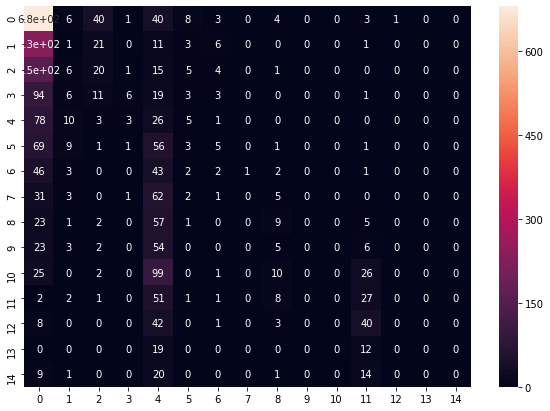

In [161]:
#Plotting the confusion matrix
cm=confusion_matrix(y_test,all_labels_prob)
plt.figure(figsize = (10,7))
sns.heatmap(cm, annot=True)

In [162]:
#Classification report of the confusion matrix represented above
cr = classification_report(y_test,all_labels_prob)
print("\nClasification report:\n", cr)


Clasification report:
               precision    recall  f1-score   support

           0       0.46      0.87      0.60       786
           1       0.02      0.00      0.01       273
           2       0.19      0.10      0.13       204
           3       0.46      0.04      0.08       143
           4       0.04      0.21      0.07       126
           5       0.09      0.02      0.03       146
           6       0.07      0.02      0.03       100
           7       0.00      0.00      0.00       105
           8       0.18      0.09      0.12        98
           9       0.00      0.00      0.00        93
          10       0.00      0.00      0.00       163
          11       0.20      0.29      0.23        93
          12       0.00      0.00      0.00        94
          13       0.00      0.00      0.00        31
          14       0.00      0.00      0.00        45

    accuracy                           0.31      2500
   macro avg       0.11      0.11      0.09      2500
we

C:\Users\Shreyas\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


# 7. Discussion----------------------

Q) Is it overfitting or underfitting? Why?

The decrease in the accuracy score was seen after implementing the hyperparameter tuning and 10-fold cross validation.
The only way the decrease in the accuracy after hyperparameter tuning and k fold cross validation can be justified is by the fact that the data is overfitting. 


We have implemented the logistic regression 14 times and have used k fold cross validation with k=10 (split of data- 80% training and 20% testing),repeated the implementation 10 times with 10 different test data splits (each time a new 20% of all data).Therefore the result (in the case of hyperparameter tuning and cross validation) is more accurate and somewhat different than just one time split (as done in the model implementation) and may therefore account for the decrease in accuracy. 


The accuracy of such a model in general can be low because the model is repeatedly tested against unseen data all the time, and the final accuracy score is the mean of the individual test scores.



Accuracy can be increased by applying one or more of the following:

1. Exploring more classifiers - Logistic Regression learns from a linear decision surface that separates the classes. It may be the case that 14 classes given here may not be separated linearly. In such a case we might need to take a look at other classifiers such as Support Vector Machines which can deal with more complex decision boundaries.

2. Carrying out Error Analysis - We might find that some of the models work well with a set of parameters while the other don’t. In this case, Ensemble Techniques (such as VotingClassifier) often give the best results. 

3. Including More Features – More features can also be included in the dataset in order to account for an increase in the accuracy.




# ---------------Bias- Variance tradeoff discussion----------------------

The Bias- Variance tradeoff in this case can be given from taking a look at the confusion matrix and the classification report of the model implemented. Logistic Regression model is a high-bias, low-variance model in general and it can be seen that it is having high precision and low recall from the classification report. 


A model might not end up doing well on the training data but it converges better. Such a model would have a higher bias and lower variance, which is our case.


We can have a model which gets some false negatives but gets fewer false positives, i.e, it is high precision - low recall, thus corresponding to the high bias - low variance case.


## The main references for the assignment were the tutorial ipynb notebooks and the necessary references are mentioned wherever used.